# Set up & Check Environment

In [1]:
import os
import re 
import pickle
import math
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array
import tensorflow.image as tfi
from tqdm import tqdm
from tensorflow.keras.utils import load_img, img_to_array
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
import random

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
!nvidia-smi

Tue Nov 21 19:30:52 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.182.03   Driver Version: 470.182.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P8    11W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# 1. Data
## 1.1 Data Load

In [4]:
DIR_PATH = '/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images'

In [5]:
print(f"Data length : {len(os.listdir(DIR_PATH))}")

file_int_list = [int(re.search(r'\d+', filename).group()) for filename in os.listdir(DIR_PATH)]
print(f"Number of Image: {len(set(file_int_list))}")

Data length : 600
Number of Image: 200


In [6]:
file_list = os.listdir(DIR_PATH)

input_images = []
label_images= []

for file in file_list:
    if file.endswith(').png') or file.endswith('.png.png'):
        input_images.append(os.path.join(DIR_PATH, file))
    if file.endswith('.png___fuse.png'):
        label_images.append(os.path.join(DIR_PATH, file))

In [7]:
target_color = img_to_array(load_img(label_images[0], color_mode = 'grayscale'))
target_color = np.unique(target_color).astype(np.uint8)

color_to_label = {
    color_idx: idx for idx, color_idx in enumerate(target_color)
}

print(f"target_color = {target_color}")
print(f"color : label = {color_to_label}")

target_color = [ 89 132 155 165 175 213]
color : label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}


In [8]:
for label in color_to_label:
    print(label)

89
132
155
165
175
213


In [9]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img

target_colors = []
for image_path in label_images:
    target_color = img_to_array(load_img(image_path, color_mode='grayscale'))
    target_color = np.unique(target_color).astype(np.uint8)
    target_colors.append(target_color)

# Flatten the list of unique values from each image
all_unique_values = np.unique(np.concatenate(target_colors))

print("Unique Values across all Target Colors:", all_unique_values)

Unique Values across all Target Colors: [  0  89 132 155 165 175 213]


In [35]:
target_color = img_to_array(load_img(label_images[0], color_mode='grayscale'))
print(target_color.shape)

(1080, 1920, 1)


In [36]:
for image_path in label_images:
    target_color = img_to_array(load_img(image_path, color_mode='grayscale'))
    target_color = np.unique(target_color).astype(np.uint8)
    for i in target_color:
        if i == 0:
            print (image_path)
            print (target_color)

/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (446).png___fuse.png
[  0  89 132 155 165 175 213]
/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (417).png___fuse.png
[  0  89 132 155 165 175 213]
/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (430).png___fuse.png
[  0  89 132 155 165 175 213]
/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (314).png___fuse.png
[  0  89 132 155 165 175 213]
/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (313).png___fuse.png
[  0  89 132 155 165 175 213]
/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/night ride (39).png___fuse.png
[  0  89 132 155 165 175 213]
/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride 

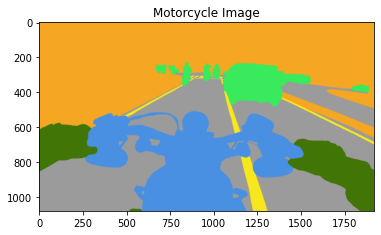

In [37]:
import matplotlib.pyplot as plt
from skimage.io import imread

# Load the image
image_path = "/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (446).png___fuse.png"
image = imread(image_path)

# Plot the image
plt.imshow(image)
plt.title("Motorcycle Image")
plt.show()

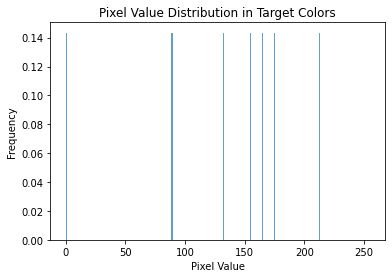

In [38]:
image_path = "/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/Screenshot (446).png___fuse.png"
target_color = img_to_array(load_img(image_path, color_mode='grayscale'))
target_color = np.unique(target_color).astype(np.uint8)


# Plot the histogram
plt.hist(target_color.flatten(), bins=256, range=(0, 255), density=True, alpha=0.7)
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Pixel Value Distribution in Target Colors')
plt.show()


In [13]:
def path_to_input_image(path):
    return img_to_array(load_img(path, target_size = img_size))

def path_to_target(path):
    img = img_to_array(load_img(path, target_size = img_size, color_mode = 'grayscale'))
    img = img.astype('uint8')
    for label in color_to_label:
        img[img == label] = color_to_label[label]
    return img

In [14]:
img_size = (448, 448)
num_imgs = len(input_images)

random.Random(10).shuffle(input_images)
random.Random(10).shuffle(label_images)

input_imgs = np.zeros((num_imgs, ) + img_size + (3, ), dtype = 'float32')
targets = np.zeros((num_imgs, ) + img_size + (1, ), dtype = 'uint8')

for i in range(num_imgs):
    input_imgs[i] = path_to_input_image(input_images[i])
    targets[i] = path_to_target(label_images[i])

In [15]:
num_val_samples = 30
num_test_samples = 30

test_input_imgs = input_imgs[-num_test_samples:]
test_targets = targets[-num_test_samples:]

In [7]:
with open('./test_files.pickle', 'rb') as f:
    test_files = pickle.load(f)

print(test_files)

['night ride (18)', 'Screenshot (410)', 'night ride (74)', 'Screenshot (416)', 'night ride (80)', 'Screenshot (441)', 'Screenshot (434)', 'night ride (57)', 'Screenshot (375)', 'night ride (10)', 'Screenshot (323)', 'Screenshot (436)', 'Screenshot (406)', 'Screenshot (357)', 'Screenshot (427)', 'night ride (91)', 'night ride (36)', 'night ride (98)', 'Screenshot (381)', 'night ride (7)', 'Screenshot (414)', 'night ride (27)', 'night ride (20)', 'Screenshot (393)', 'Screenshot (312)', 'night ride (50)', 'night ride (25)', 'night ride (11)', 'Screenshot (319)', 'night ride (49)']


In [7]:
file_list = os.listdir(DIR_PATH)
input_images = []
label_images = []
for file in file_list:
        # if file path name contains a test_file, skip
        if any(test_file in file for test_file in test_files):
            continue
        elif file.endswith(').png') or file.endswith('.png.png'):
            input_images.append(os.path.join(DIR_PATH, file))
        elif file.endswith('.png___fuse.png'):
            label_images.append(os.path.join(DIR_PATH, file))
print(len(input_images))

170


In [8]:
def build_augmentation(is_train=True):
    if is_train:
        return Compose([
            HorizontalFlip(p=0.5),   
                    RandomSizedCrop(        
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=448,
                        width=448,
                        p=0.5
                        ),
                    Resize(              
                        width=448,
                        height=448
                        )
                    ])
    return Compose([ 
                Resize(
                    width=448,
                    height=448
                    )
                ])

In [9]:
class RandomGenerator(tf.keras.utils.Sequence):
    def __init__(self, 
               dir_path, test_files,
               batch_size=4,
               img_size=(448, 448, 3),
               output_size=(448, 448),
               is_train=True,
               augmentation=None):
        self.dir_path = dir_path
        self.test_files = test_files
        self.batch_size = batch_size
        self.is_train = is_train
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size
        self.color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
        self.data = self.load_dataset()
        
    # Load Dataset 
    # Number of Validation dataset or Test dataset = 30
    def load_dataset(self):
        input_images = []
        label_images= []

        file_list = os.listdir(self.dir_path)

        for file in file_list:
            # if file path name contains a test_file, skip
            if any(test_file in file for test_file in test_files):
                continue
            elif file.endswith(').png') or file.endswith('.png.png'):
                input_images.append(os.path.join(DIR_PATH, file))
            elif file.endswith('.png___fuse.png'):
                label_images.append(os.path.join(DIR_PATH, file))
        
        input_images.sort()
        label_images.sort()
        
        assert len(input_images) == len(label_images)
        
        data = [_ for _ in zip (input_images, label_images)]
        
        if self.is_train:
            return data[:-30]
        return data[-30:]
    
    # Retrieve Data length
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)
    
    
    # Retrieve one batch augmented item set
    def __getitem__(self, index):
        batch_data = self.data[
            index*self.batch_size:
            (index + 1)*self.batch_size
        ]
        
        # setup dimensions
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = img_to_array(load_img(output_path, color_mode = 'grayscale'))
            _output = _output.astype('uint8')
                
            for unique_value in self.color_to_label:
                _output[_output == unique_value] = self.color_to_label[unique_value]
            
            data = {
              "image": _input,
              "mask": _output,
            }
            augmented = self.augmentation(**data)
            
            # Convert input image pixels value to 0~1
            # Because augmented["mask"] value consists of 0 value or 1 value
            inputs[i] = augmented["image"][:,:,:3]/255
            outputs[i] = np.squeeze(augmented["mask"], axis=-1)
            
        return inputs, outputs
    
    # Randomly shuffle the dataset
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [546]:
class TestGenerator(tf.keras.utils.Sequence):
    def __init__(self, 
               dir_path, test_files,
               batch_size=4,
               img_size=(448, 448, 3),
               output_size=(448, 448),
               is_train=True,
               augmentation=None):
        self.dir_path = dir_path
        self.test_files = test_files
        self.batch_size = batch_size
        self.is_train = is_train
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size
        self.color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
        self.data = self.load_dataset()
        
    # Load Dataset 
    # Number of Validation dataset or Test dataset = 30
    def load_dataset(self):
        input_images = []
        label_images= []

        base_dir = "/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/"        
        for file in test_files:
            input_path = base_dir + file + ".png"
            label_path = base_dir + file + ".png___fuse.png"
            input_images.append(input_path)
            label_images.append(label_path)
            
        
        print(len(input_images))
        print(len(label_images))
        data = [_ for _ in zip (input_images, label_images)]
        
        if self.is_train:
            return data[:-30]
        return data
    
    # Retrieve Data length
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)
    
    
    # Retrieve one batch augmented item set
    def __getitem__(self, index):
        batch_data = self.data[
            index*self.batch_size:
            (index + 1)*self.batch_size
        ]
        
        # setup dimensions
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = img_to_array(load_img(output_path, color_mode = 'grayscale'))
            _output = _output.astype('uint8')
                
            for unique_value in self.color_to_label:
                _output[_output == unique_value] = self.color_to_label[unique_value]
            
            data = {
              "image": _input,
              "mask": _output,
            }
            augmented = self.augmentation(**data)
            
            # Convert input image pixels value to 0~1
            # Because augmented["mask"] value consists of 0 value or 1 value
            inputs[i] = augmented["image"][:,:,:3]/255
            outputs[i] = np.squeeze(augmented["mask"], axis=-1)
            
        return inputs, outputs
    
    # Randomly shuffle the dataset
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [10]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = RandomGenerator(
    DIR_PATH, test_files,
    augmentation=augmentation,
)

test_generator = RandomGenerator(
    DIR_PATH, test_files,
    augmentation=test_preproc,
    is_train=False
)

In [547]:
real_test_generator = TestGenerator(
    DIR_PATH, test_files,
    augmentation=test_preproc,
    is_train=False
)

30
30


# 2. Model
## 2.1 Build Model

In [11]:
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, Add, GlobalAveragePooling2D
from tensorflow.keras.layers import Activation, BatchNormalization, Concatenate, SeparableConv2D, UpSampling2D
from tensorflow.keras.layers import Input, Conv2D

In [12]:
def entry_flow_block(inputs):
    x = Conv2D(32, 3, padding='same', kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(64, 3, padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    layer_list = [128, 256, 728]
    
    for i in range(3):
        residual = x 
        residual = Conv2D(layer_list[i], 1, strides=2, padding='same')(residual)
        
        if i != 0:
            x = Activation('relu')(x)
        x = SeparableConv2D(layer_list[i], 3, padding='same', kernel_initializer='he_normal')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = SeparableConv2D(layer_list[i], 3, padding='same', kernel_initializer='he_normal')(x)
        x = BatchNormalization()(x)
        x = MaxPooling2D(pool_size=(3, 3), strides=2, padding="same")(x)
        x = Add()([x, residual])
    return x
    
def middle_flow_block(inputs):
    residual = inputs
    x = inputs
    
    for i in range(3):
        x = Activation('relu')(x)
        x = SeparableConv2D(728, 3, padding='same')(x)
        x = BatchNormalization()(x)
    
    x = Add()([x, residual])
    
    return x
    
def exit_flow_block(inputs):
    residual = inputs
    x = inputs
    residual = Conv2D(1024, 1, strides=2, padding='same')(residual)
    
    x = Activation('relu')(x)
    x = SeparableConv2D(728, 3, padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    
    x = Activation('relu')(x)
    x = SeparableConv2D(1024, 3, padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding="same")(x)
    x = Add()([x, residual])
    
    x = SeparableConv2D(1536, 3, padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x) 
    x = Activation('relu')(x)
    
    x = SeparableConv2D(2048, 3, padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x) 
    x = Activation('relu')(x)
    
    return x

In [13]:
def ASPP(inputs):
    
    conv_1 = SeparableConv2D(2048, 1)(inputs)
    conv_1 = BatchNormalization()(conv_1)
    conv_1 = Activation('relu')(conv_1)
    
    conv_6 = SeparableConv2D(2048, 3, strides=1, padding='same', dilation_rate=6, kernel_initializer='he_normal')(inputs)
    conv_6 = BatchNormalization()(conv_6)
    conv_6 = Activation('relu')(conv_6)
    
    conv_12 = SeparableConv2D(2048, 3, strides=1, padding='same', dilation_rate=12, kernel_initializer='he_normal')(inputs)
    conv_12 = BatchNormalization()(conv_12)
    conv_12 = Activation('relu')(conv_12)
    
    conv_18 = SeparableConv2D(2048, 3, strides=1, padding='same', dilation_rate=18, kernel_initializer='he_normal')(inputs)
    conv_18 = BatchNormalization()(conv_18)
    conv_18 = Activation('relu')(conv_18)
    
    img_pooling = MaxPooling2D((2,2))(inputs)
    img_pooling = Conv2D(2048, 1, padding='same')(img_pooling)
    img_pooling = BatchNormalization()(img_pooling)
    img_pooling = Activation('relu')(img_pooling)
    img_pooling = UpSampling2D(size=(2, 2), interpolation='bilinear')(img_pooling)
    
    outputs = Concatenate()([conv_1, conv_6, conv_12, conv_18, img_pooling])
    outputs = Conv2D(256, 1, padding='same')(outputs)
    outputs = UpSampling2D(size=(2, 2), interpolation='bilinear')(outputs)
    return outputs

In [14]:
def DLV3Plus_model(input_shape=(448, 448, 3)):
    min_filter_size = 64
    max_filter_size = 512
    
    encode_blocks = []
    
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = inputs
    
    # Encoder
    # Entry Flow
    x = entry_flow_block(inputs)
    # Middle Flow
    for i in range(8):
        x = middle_flow_block(x)
    # Exit Flow
    output_1 = exit_flow_block(x) # 32, 32, 2048 | Output strides = 16
    print(output_1.shape)
    output_1 = Conv2D(48, 1, padding='same')(output_1) # 32, 32, 48
    output_1 = UpSampling2D(size=(4, 4), interpolation='bilinear')(output_1) # 128, 128, 48
    output_2 = ASPP(x) # 128, 128, 256
    print(output_2.shape)
    outputs = Concatenate()([output_1, output_2])
    outputs = Conv2D(64, 1, padding='same')(outputs)
    outputs = UpSampling2D(size=(4, 4), interpolation='bilinear')(outputs) #512, 512, 64
    print(outputs.shape)
    outputs = Conv2D(6, 1, padding='same', activation='softmax')(outputs)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [15]:
DLV3Plus = DLV3Plus_model() 
DLV3Plus.summary()

(None, 28, 28, 2048)
(None, 112, 112, 256)
(None, 448, 448, 64)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 448, 448, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 448, 448, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 448, 448, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 448, 448, 32) 0           batch_normalization[0][0]        
______________________________

## 2.2 Train Model

In [16]:
from keras.callbacks import Callback
import os

class SaveModelEveryEpoch(Callback):
    def __init__(self, save_path, first_epoch=1):
        super(SaveModelEveryEpoch, self).__init__()
        self.save_path = save_path # Path where you want to save the models
        self.first_epoch = first_epoch

    def on_epoch_end(self, epoch, logs=None):
        file_name = "{}--{:.4f}-{:.4f}-{:.4f}-{:.4f}.h5".format(self.first_epoch + epoch, logs['loss'], logs['accuracy'],logs['val_loss'],
logs['val_accuracy'])
        model_save_path = os.path.join(self.save_path, file_name)

        self.model.save(model_save_path)
        # print(f'Model saved to {model_save_path}')

    def get_config(self):
        config = super(SaveModelEveryEpoch, self).get_config()
        config.update({'save_path': self.save_path, 'first_epoch': self.first_epoch})
        return config


In [17]:
DLV3_plus_model_path = os.getenv('HOME')+'/aiffel/AIFEL_Quest/DL_Thon/model'

In [19]:
model_path = os.getenv('HOME')+'/aiffel/AIFEL_Quest/DL_Thon/model/89--0.5359-0.8135-0.5832-0.8022.h5'

DLV3Plus = tf.keras.models.load_model(model_path)

In [20]:
model_checkpoint_callback = SaveModelEveryEpoch(DLV3_plus_model_path, 100)

callbacks = [model_checkpoint_callback]

DLV3Plus.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = DLV3Plus.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
     callbacks=callbacks, 
 )

Epoch 1/100
35/35 [==============================] - 77s 2s/step - loss: 0.6328 - accuracy: 0.7798 - val_loss: 0.6418 - val_accuracy: 0.7957
Epoch 2/100
35/35 [==============================] - 71s 2s/step - loss: 0.4798 - accuracy: 0.8283 - val_loss: 0.5422 - val_accuracy: 0.7990
Epoch 3/100
35/35 [==============================] - 71s 2s/step - loss: 0.5304 - accuracy: 0.8156 - val_loss: 0.6261 - val_accuracy: 0.7633
Epoch 4/100
35/35 [==============================] - 71s 2s/step - loss: 0.5476 - accuracy: 0.8202 - val_loss: 0.4345 - val_accuracy: 0.8317
Epoch 5/100
35/35 [==============================] - 71s 2s/step - loss: 0.4535 - accuracy: 0.8388 - val_loss: 0.7119 - val_accuracy: 0.7244
Epoch 6/100
35/35 [==============================] - 71s 2s/step - loss: 0.5163 - accuracy: 0.8157 - val_loss: 0.6002 - val_accuracy: 0.7837
Epoch 7/100
35/35 [==============================] - 71s 2s/step - loss: 0.5497 - accuracy: 0.8044 - val_loss: 0.5675 - val_accuracy: 0.7966
Epoch 8/100
3

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

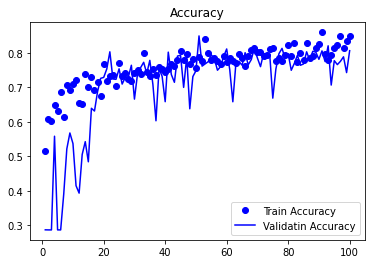

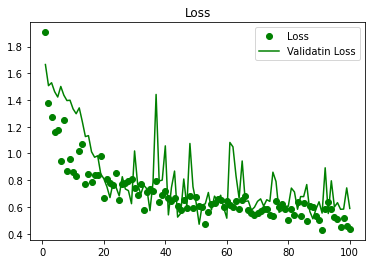

<Figure size 432x288 with 0 Axes>

In [30]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss =  history.history["val_loss"]
                 
epochs = range(1, 101)                           
                            
plt.plot(epochs, accuracy, "bo", label="Train Accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validatin Accuracy")
plt.title("Accuracy")
plt.legend()
plt.figure()                            
                            
plt.plot(epochs, loss, "go", label="Loss")
plt.plot(epochs, val_loss, "g", label="Validatin Loss")
plt.title("Loss")
plt.legend()
plt.figure()  

In [31]:
import os
import json

history_path = os.path.join(os.getenv('HOME'), 'aiffel/AIFEL_Quest/DL_Thon/history/history_DLV3_plus.json')

with open(history_path, 'w') as json_file:
    json.dump(history.history, json_file)

## Model Load

In [24]:
model_path = os.getenv('HOME')+'/aiffel/AIFEL_Quest/DL_Thon/model/89--0.5359-0.8135-0.5832-0.8022.h5'

DLV3Plus = tf.keras.models.load_model(model_path)

In [96]:
evaluation = DLV3Plus.evaluate(
    test_generator,
    steps=len(test_generator)
)

# Print the evaluation results
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])


8/8 [==============================] - 6s 532ms/step - loss: 0.5832 - accuracy: 0.8022
Test Loss: 0.5831860899925232
Test Accuracy: 0.8021637201309204


In [111]:
evaluation = DLV3Plus.evaluate(
    real_test_generator,
    steps=len(real_test_generator)
)

# Print the evaluation results
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

8/8 [==============================] - 5s 549ms/step - loss: 0.7852 - accuracy: 0.7416
Test Loss: 0.7852449417114258
Test Accuracy: 0.7415715456008911


In [548]:
predictions = DLV3Plus.predict(real_test_generator, steps=len(real_test_generator))

## 2.3 Inference

In [25]:
test_input_images_path = []
test_label_images_path = []

base_dir = "/aiffel/aiffel/motorcycle/www.acmeai.tech ODataset 1 - Motorcycle Night Ride Dataset/images/"        
for file in test_files:
    input_path = base_dir + file + ".png"
    label_path = base_dir + file + ".png___fuse.png"
    test_input_images_path.append(input_path)
    test_label_images_path.append(label_path)

In [334]:
def get_output(model, preproc, image_path, label_path, index):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    
    processed = preproc(**data)
    processed["image"] = processed["image"][:,:,:3]
    
    # Retrieve Predicted Image
    # Input pixel value -> 0~1
    # If Output pixel value > threshold, convert the output value to real scale
    output = model(np.expand_dims(processed["image"]/255, axis=0))
    output = (output[0, :, :, index].numpy()>0.5).astype(np.uint8)*255
    print(output)
    prediction = output/255
    print(prediction)
    
    output = Image.fromarray(output)
    
    # Resize output and Convert Format
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    
    backgroud = Image.fromarray(origin_img).convert('RGBA')
    output = Image.blend(backgroud, output, alpha=0.5)
    output.show()
     
    if label_path:   
        target = img_to_array(load_img(label_path, target_size = img_size, color_mode = 'grayscale'))
        target = target.astype('uint8')
        for label in color_to_label:
            target[target == label] = color_to_label[label]
        
        
        return output, prediction, target
    
    else:
        return output, prediction, _


In [335]:
image_path = test_input_images_path[0]
label_path = test_label_images_path[0]

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


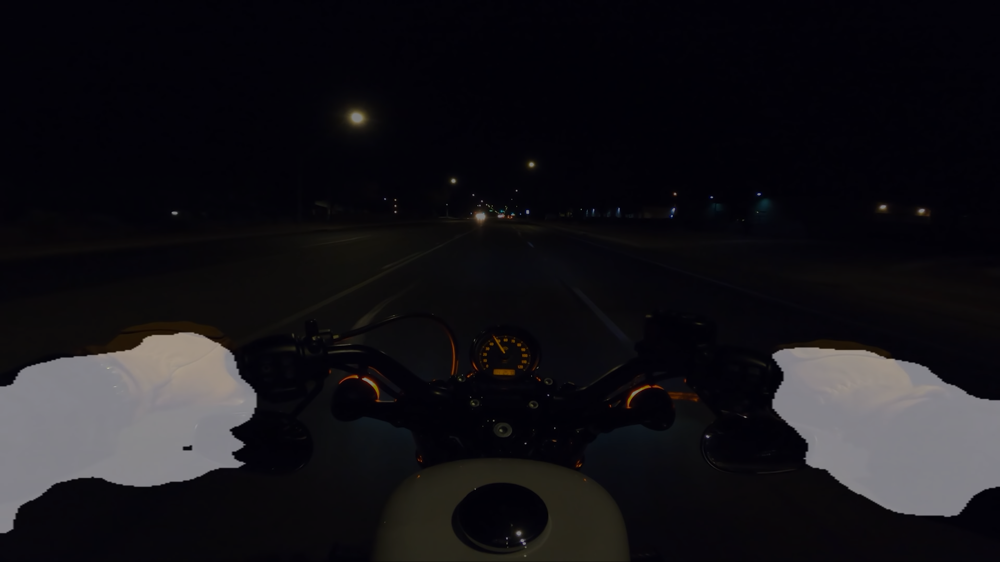

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


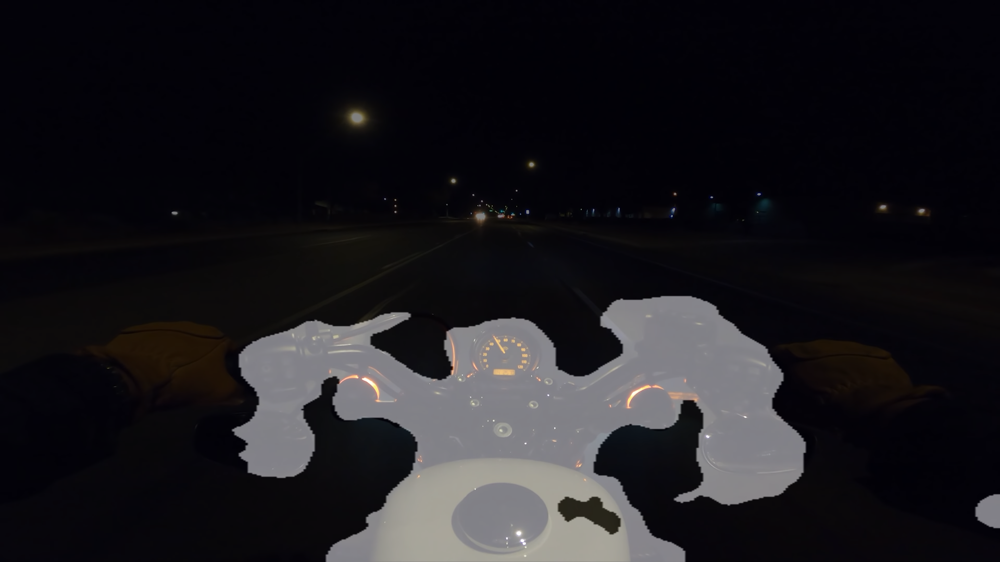

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


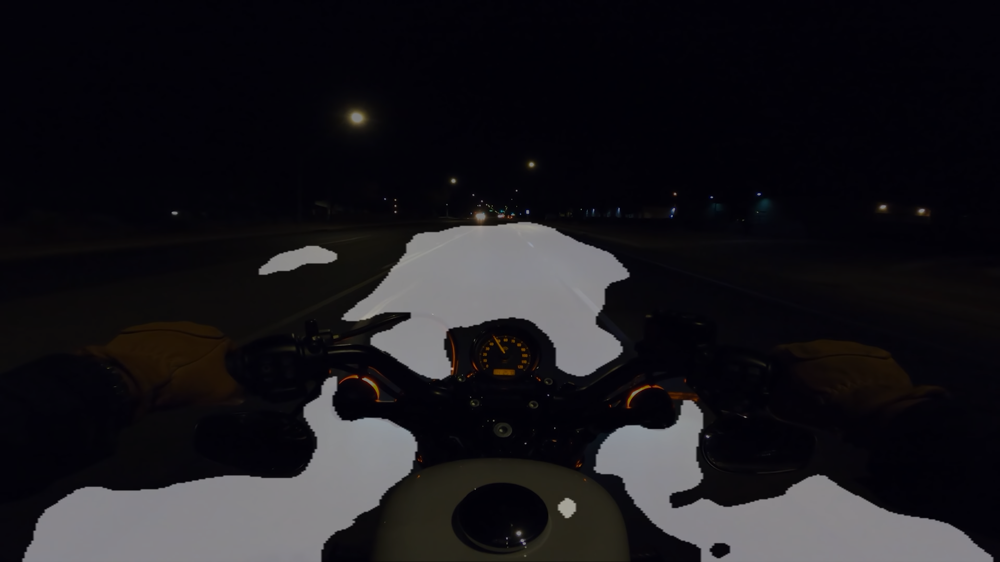

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


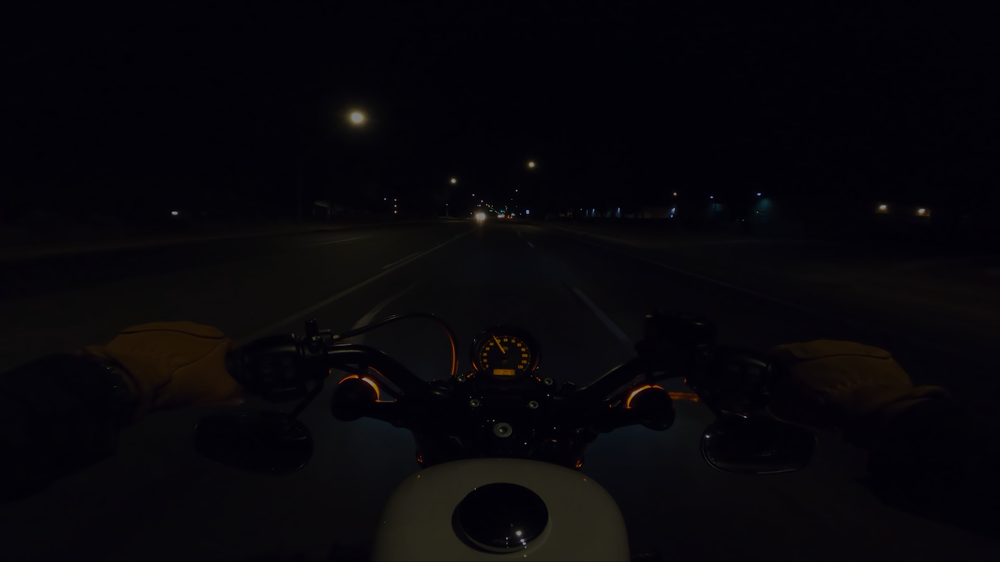

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]
[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


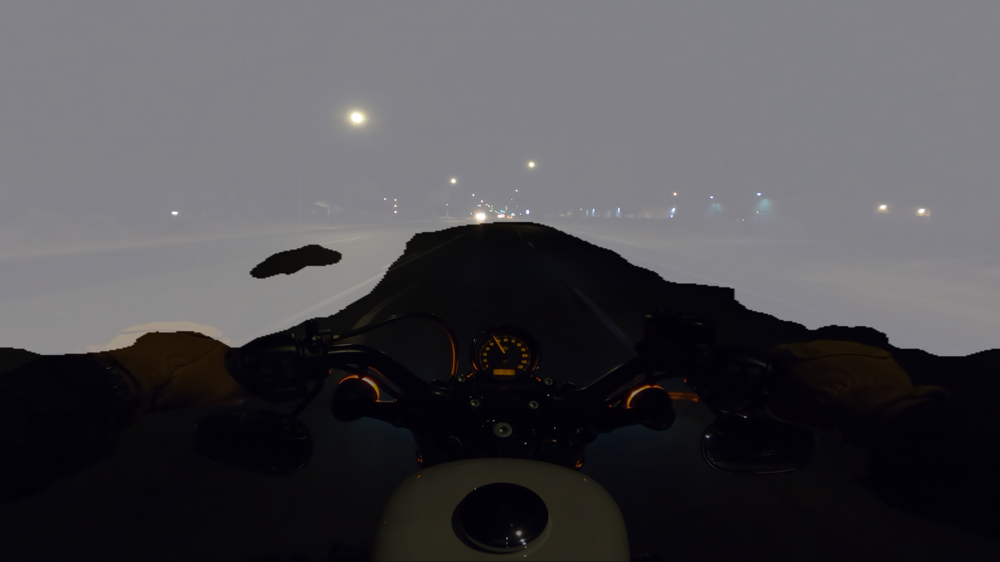

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


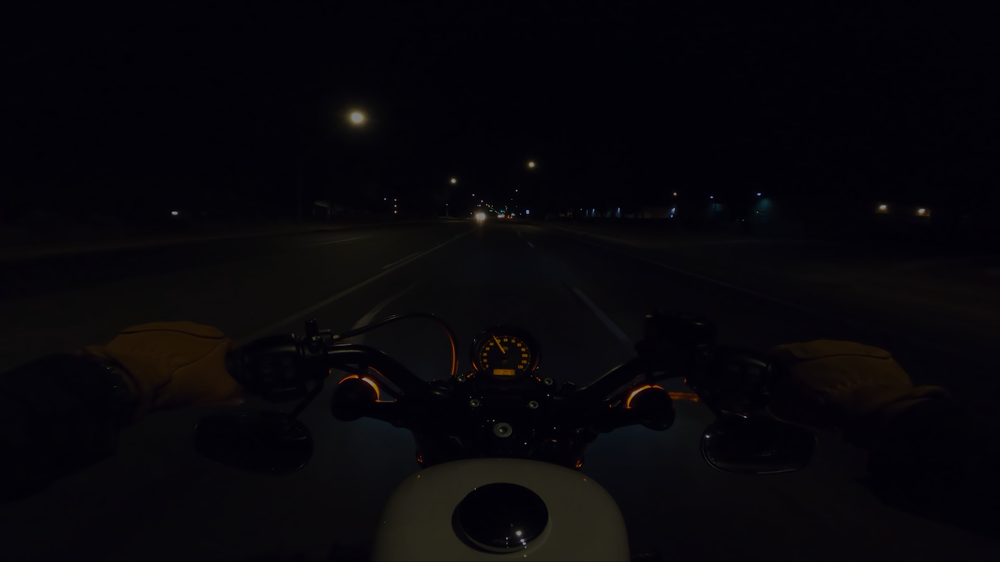

In [336]:
for i in range(30):
    output, prediction, target = get_output(
     DLV3Plus, 
     test_preproc,
     image_path=test_input_images_path[i],
     label_path=test_label_images_path[i],
     index=i,
    )

In [ ]:

        self.color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
        self.data = self.load_dataset()
   
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = img_to_array(load_img(output_path, color_mode = 'grayscale'))
            _output = _output.astype('uint8')
                
            for unique_value in self.color_to_label:
                _output[_output == unique_value] = self.color_to_label[unique_value]
   

In [590]:
import cv2

def compare_org_gt_pm(model, preproc, prediction, image_path, label_path, index):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    origin_img = cv2.resize(origin_img, (448, 448))
    
    color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
    
    ground_truth = img_to_array(load_img(label_path, target_size = img_size, color_mode = 'grayscale'))
    ground_truth = ground_truth.astype('uint8')
    ground_truth = ground_truth[:,:,0]
    
    for unique_value in color_to_label:
        ground_truth[ground_truth == unique_value] = color_to_label[unique_value]
    
    pred_mask = np.argmax(prediction, axis=-1)
    
    plt.figure(figsize=(12, 4))
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(origin_img)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth)
    plt.title("Ground Truth Mask")
    plt.axis('off')
    
    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask)
    plt.title("Predicted Mask")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

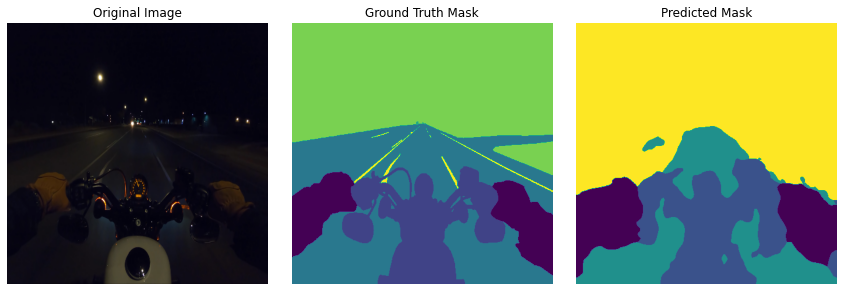

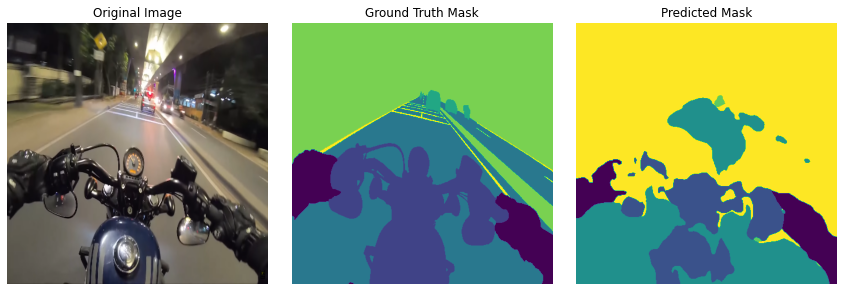

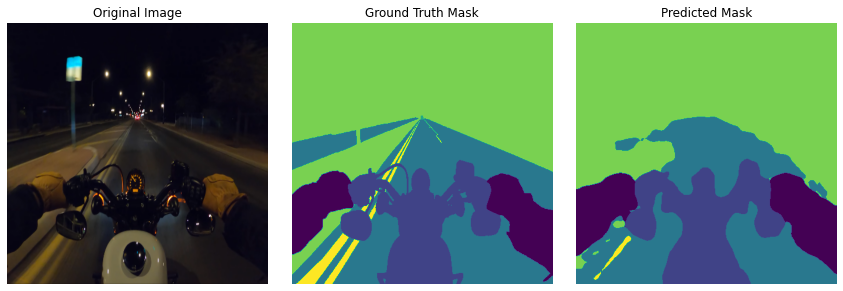

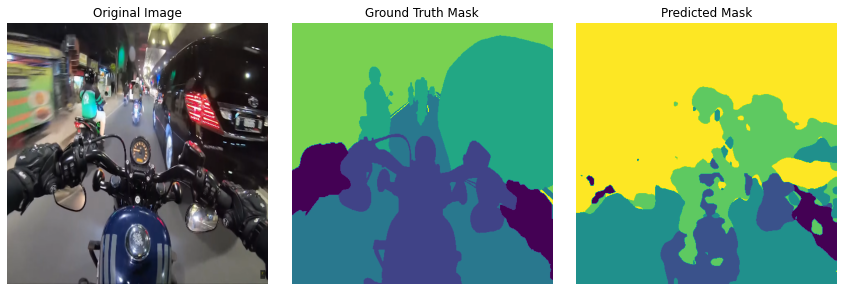

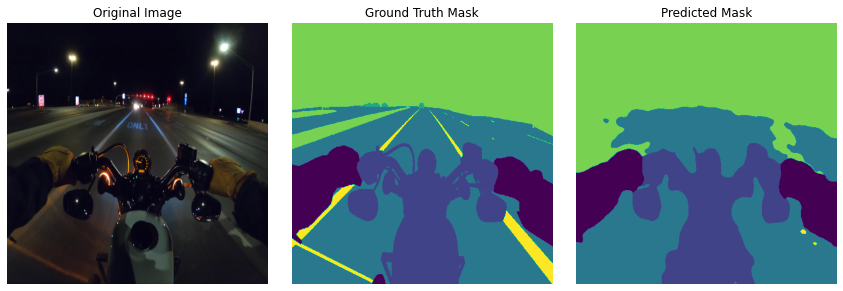

...

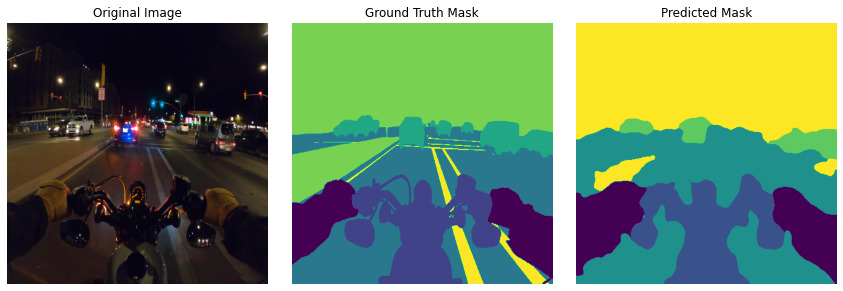

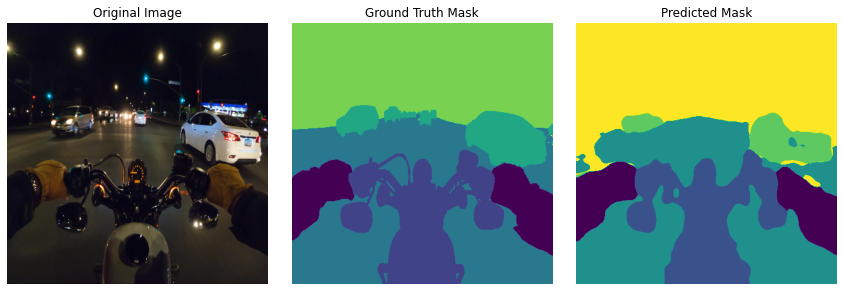

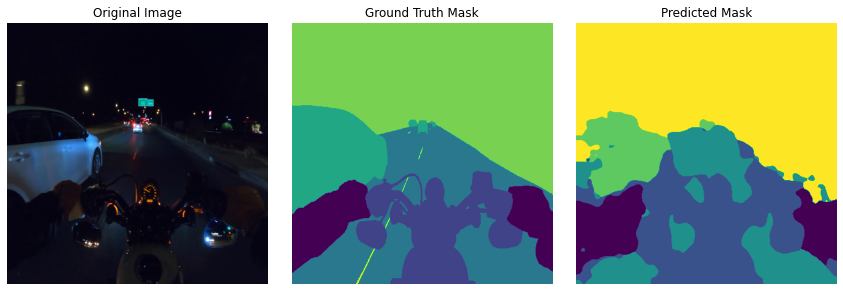

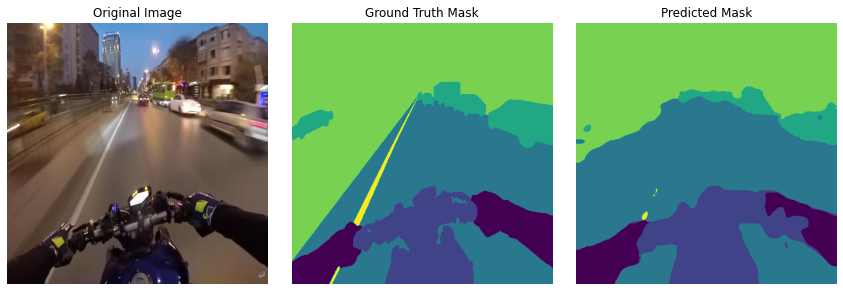

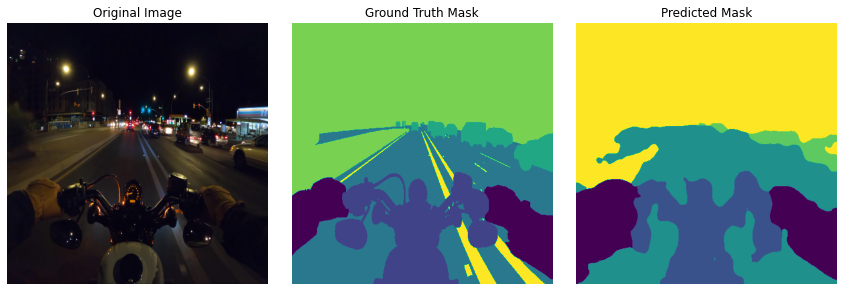

In [591]:
for i in range(30):
    compare_org_gt_pm(
        DLV3Plus,
        test_preproc,
        prediction = predictions[i],
        image_path = test_input_images_path[i],
        label_path = test_label_images_path[i],
        index=i
    )

In [592]:
def get_output_not_show(model, preproc, image_path, label_path, index):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    
    processed = preproc(**data)
    processed["image"] = processed["image"][:,:,:3]
    
    # Retrieve Predicted Image
    # Input pixel value -> 0~1
    # If Output pixel value > threshold, convert the output value to real scale
    output = model(np.expand_dims(processed["image"]/255, axis=0))
    #print(output.shape)
    output = (output[0, :, :, index].numpy()>0.3).astype(np.uint8)*255
    prediction = output/255
    
    
    output = Image.fromarray(output)
    
    # Resize output and Convert Format
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    
    backgroud = Image.fromarray(origin_img).convert('RGBA')
    output = Image.blend(backgroud, output, alpha=0.5)
    ##output.show()
     
    if label_path:   
        target = img_to_array(load_img(label_path, target_size = img_size, color_mode = 'grayscale'))
        target = target.astype('uint8')
        for label in color_to_label:
            target[target == label] = color_to_label[label]
        
        
        return output, prediction, target
    
    else:
        return output, prediction, _


In [593]:
predictions = []
outputs = []
targets = []

for i in range(30):
    prediction = []
    output = []
    
    for index in range(6):
        if index != 5:
            o, p, _ = get_output_not_show( 
                DLV3Plus,
                test_preproc,
                image_path=test_input_images_path[i],
                label_path=False,
                index=index
            )
        else:
            o, p, t = get_output_not_show( 
                DLV3Plus,
                test_preproc,
                image_path=test_input_images_path[i],
                label_path=test_label_images_path[i],
                index=index
            )
        
        prediction.append(p)
        
    predictions.append(prediction)
    targets.append(t)

In [669]:
def get_prediction_target_not_show_no_threshold(model, preproc, image_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    
    processed = preproc(**data)
    processed["image"] = processed["image"][:,:,:3]
    
    
    output = model(np.expand_dims(processed["image"]/255, axis=0))
    #print(output)
    output = np.argmax(output, axis=-1).astype(np.uint8)
    #print(output)
    #print(np.unique(output))
    prediction = np.squeeze(output)
    
    color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
    target = img_to_array(load_img(label_path, target_size = img_size, color_mode = 'grayscale'))
    target = target.astype('uint8')
    for label in color_to_label:
        target[target == label] = color_to_label[label]
    target = np.squeeze(target)
    
    return prediction, target

In [670]:
predictions = []
targets = []

for i in range(30):
        p, t = get_prediction_target_not_show_no_threshold( 
                DLV3Plus,
                test_preproc,
                image_path=test_input_images_path[i],
                label_path=test_label_images_path[i],
            )
        predictions.append(p)
        targets.append(t)

## IOU without threshold

In [708]:
def calculate_iou_score(target, prediction):
    total_area = 448 * 448
    
    IoUs = []
    areas = []
    
    #print(np.unique(prediction))
    #print(np.unique(target))

    
    for class_i in range(6):
        pred = np.where(prediction==class_i, True, False)
        tar = np.where(target==class_i, True, False)
        
        #print(pred)
        #print(tar.shape)
        #print(np.unique(tar))
        
        intersection = np.logical_and(tar, pred)
        union = np.logical_or(tar, pred)
        iou_score = np.sum(intersection) / np.sum(union)
        if np.isnan(iou_score):
            iou_score = 0 
        
        #print(iou_score)
        IoUs.append(iou_score)
        #print(pred.sum())
        # 해당 클래스가 차지하는 영역 구하기
        area = pred.sum() / total_area
        areas.append(area)
        #print(area)
        
    return IoUs, areas

In [709]:
for i in range(30):
    IoUs, areas = calculate_iou_score(targets[i], predictions[i])
    print (IoUs)

[0.6895666000733885, 0.7590097582612553, 0.5014048451548452, 0.0, 0.7997647271740114, 0.0]
[0.7388584831899921, 0.5921002658564375, 0.6192055570331201, 0.15721649484536082, 0.7149310269690418, 0.0]
[0.8843185240963856, 0.888626487814094, 0.6901176057574162, 0.0, 0.8890280419593589, 0.1441025641025641]
[0.31742138364779876, 0.3926738882554162, 0.7111434759877512, 0.2289484255739934, 0.4826916632168273, 0.0]
[0.8653115501519757, 0.8875546440714556, 0.7567854474922349, 0.0, 0.8721373576365827, 0.015729524498282407]
[0.8232441562687299, 0.7685660844595484, 0.6110628690517541, 0.3573869487875667, 0.6653411681272479, 0]
[0.5175467546754675, 0.6061385929754245, 0.7213208371124324, 3.1413941507240916e-05, 0.5493662918776643, 0.10740740740740741]
[0.5962253241926159, 0.44630004891342323, 0.22938552309684845, 0.0, 0.8893005844379083, 0.0]
[0.881038326786283, 0.8003334722801168, 0.4652491786590162, 0.20958778137619447, 0.8099030895676709, 0.0]
[0.7447930754665946, 0.6188552378799864, 0.5527314626

/tmp/ipykernel_2919/3767552614.py:21: RuntimeWarning: invalid value encountered in long_scalars
  iou_score = np.sum(intersection) / np.sum(union)


In [710]:
# 가중합 결과
sum([iou * area for iou, area in zip(IoUs, areas)])

0.8108764620990071

In [711]:
# 전체 계산 결과
total_IoUs, total_areas = [], []

for i in range(30):
    IoUs, areas = calculate_iou_score(targets[i], predictions[i])
    
    total_IoUs.append(IoUs)
    total_areas.append(areas)

/tmp/ipykernel_2919/3767552614.py:21: RuntimeWarning: invalid value encountered in long_scalars
  iou_score = np.sum(intersection) / np.sum(union)


In [712]:
# 클래스별 MIoU 구하기
MIoUs = []

for i in range(6):
    MIoUs.append(sum([iou[i] for iou in total_IoUs]) / len(total_IoUs))

In [713]:
MIoUs

[0.6814893954454979,
 0.6736451305911543,
 0.573379337533817,
 0.22920887211205063,
 0.7818296217843519,
 0.012459338371419052]

In [714]:
# MIoU의 평균

sum([sum(iou) for iou in total_IoUs]) / (len(total_IoUs) * 6)

0.49200194930638175

In [715]:
# IoU의 가중평균의 평균

avgIoUs = []

for IoUs, areas in zip(total_IoUs, total_areas):
    avgIoUs.append(sum([iou * area for iou, area in zip(IoUs, areas)]))
    
sum(avgIoUs) / len(avgIoUs)

0.701926508933044

## IOU with threshold

In [543]:
def plot_target_and_prediction(target, prediction, iou, title):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # 타겟 플로팅
    axes[0].imshow(target, cmap='gray')
    axes[0].set_title('Target')

    # 예측 플로팅
    axes[1].imshow(prediction, cmap='gray')
    axes[1].set_title(f'Prediction (IOU: {iou:.2f})')

    # 전체 제목
    plt.suptitle(title)
    plt.show()

In [544]:
def calculate_iou_and_weight_including(target, prediction):
    intersection = np.logical_and(target, prediction)
    #print(intersection.shape)
    union = np.logical_or(target, prediction)
    
    iou_score = np.sum(intersection) / np.sum(union)
    
    # 예측의 면적에 대한 가중치 계산
    prediction_area = np.sum(prediction)
    
    weight = prediction_area / (448*448)
    return iou_score, weight

==========1번째 라벨별 점수==========
1번째 라벨 IOU: 0.02555773782545198


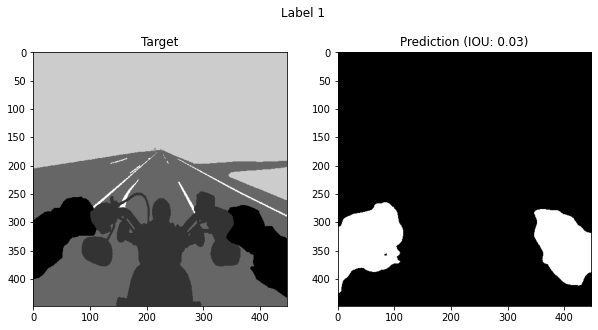

2번째 라벨 IOU: 0.1779614566661551


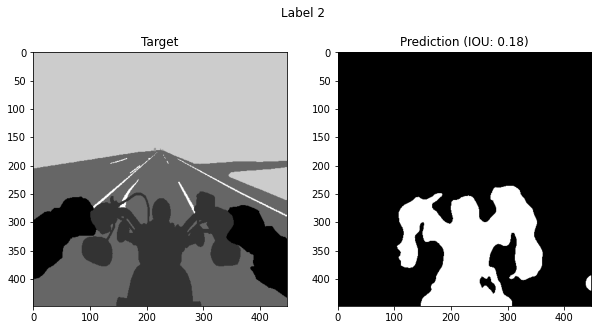

3번째 라벨 IOU: 0.1656318109700194


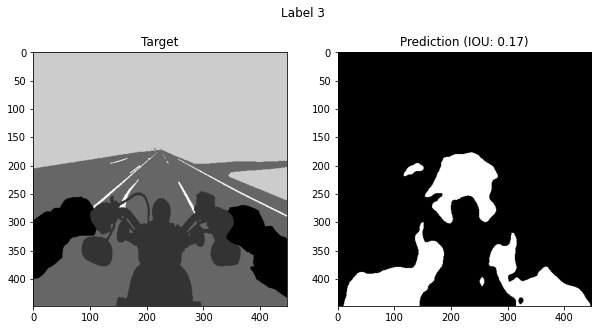

4번째 라벨 IOU: 0.0


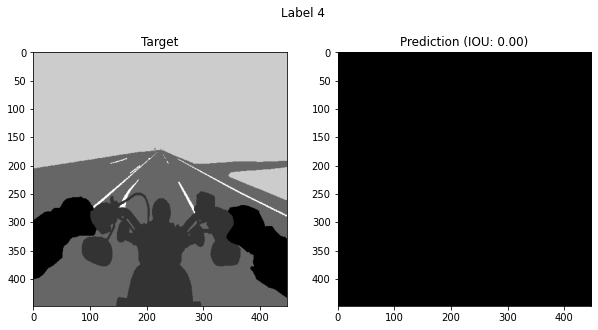

5번째 라벨 IOU: 0.5878829321663019


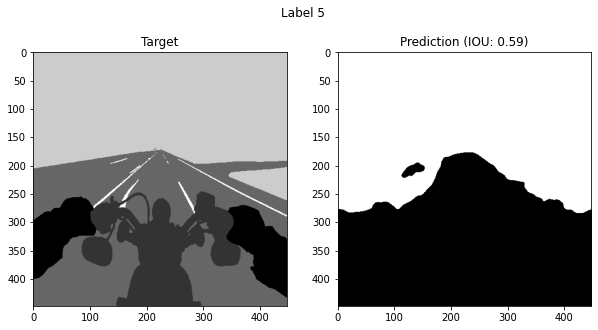

6번째 라벨 IOU: 0.0


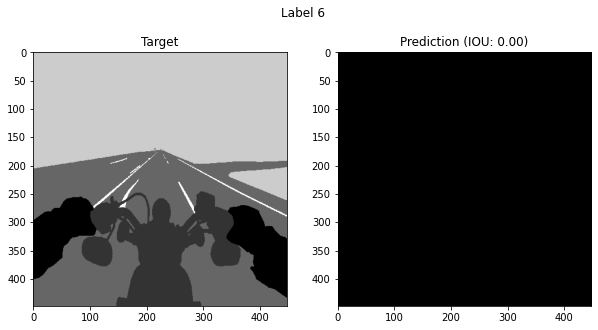

총합 가중치 IOU: 0.3734467024809198
==========2번째 라벨별 점수==========
1번째 라벨 IOU: 0.0027008777852802163


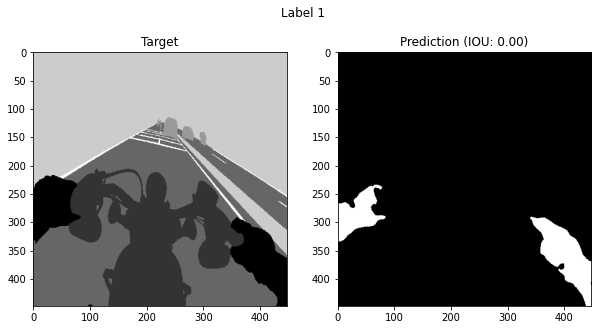

2번째 라벨 IOU: 0.11440070066466426


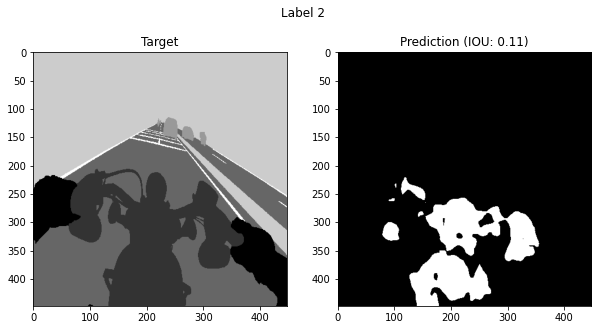

3번째 라벨 IOU: 0.23300434182914984


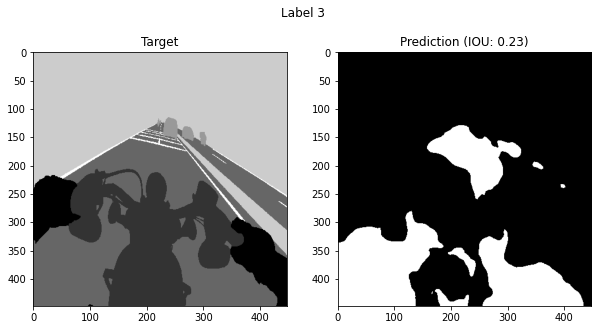

4번째 라벨 IOU: 0.0005803113262800432


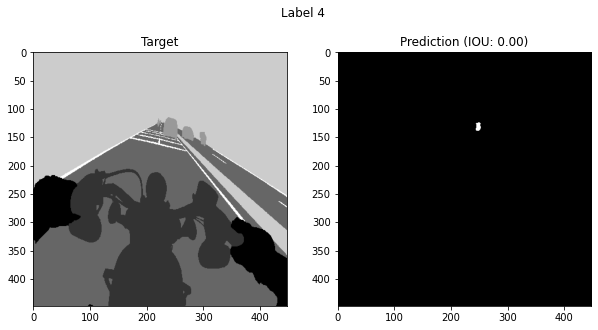

5번째 라벨 IOU: 0.6035620577244176


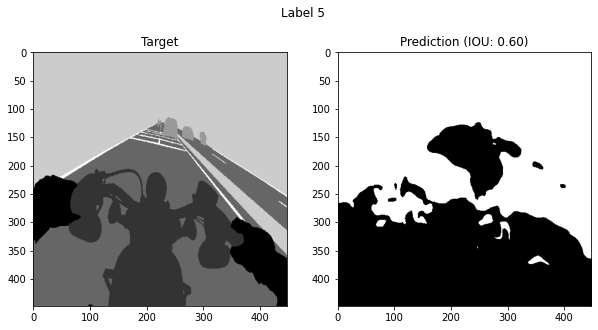

6번째 라벨 IOU: 0.0


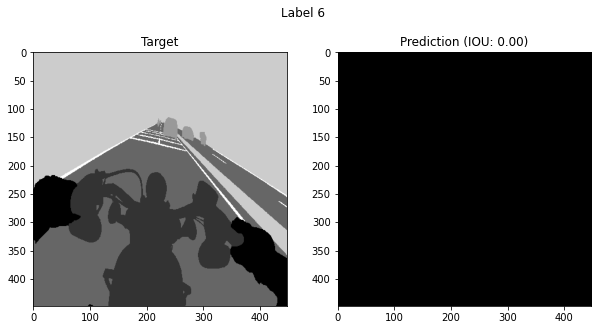

총합 가중치 IOU: 0.7864748218978728
==========3번째 라벨별 점수==========
1번째 라벨 IOU: 0.007422290863834701


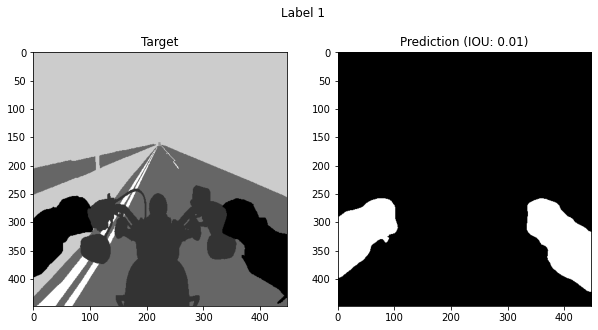

2번째 라벨 IOU: 0.16517775953001604


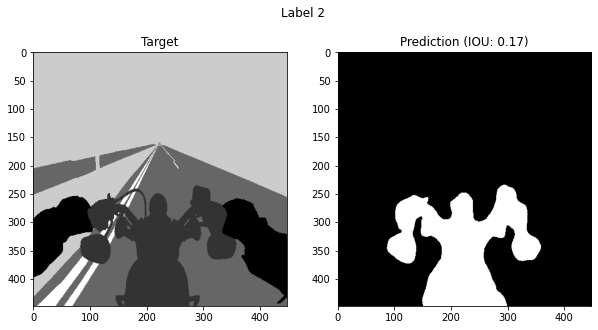

3번째 라벨 IOU: 0.24748556297515564


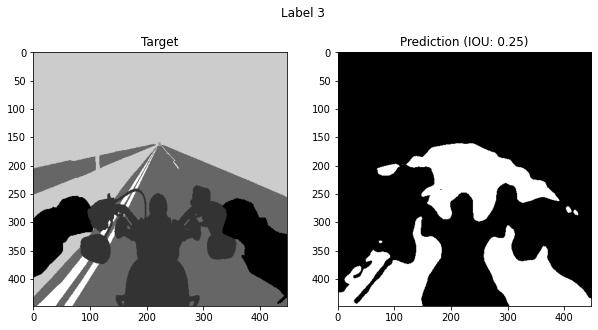

4번째 라벨 IOU: 0.0


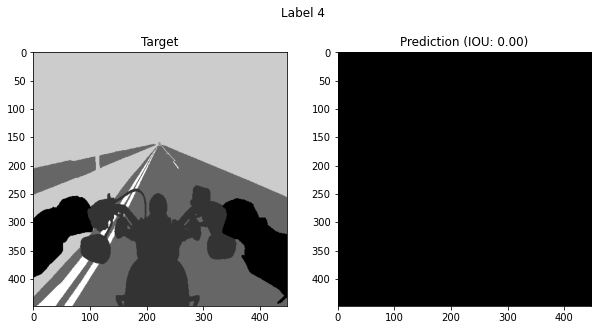

5번째 라벨 IOU: 0.5526956196181205


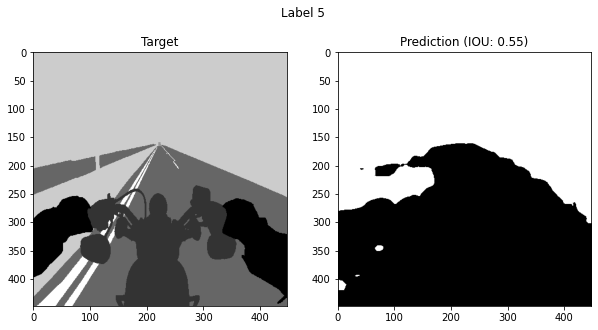

6번째 라벨 IOU: 0.002105274760400994


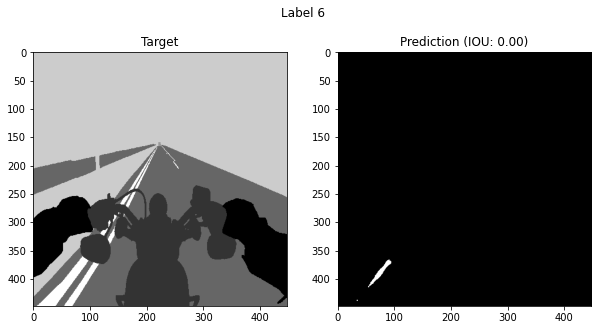

총합 가중치 IOU: 1.1445078602315375
==========4번째 라벨별 점수==========
1번째 라벨 IOU: 4.783697160078453e-05


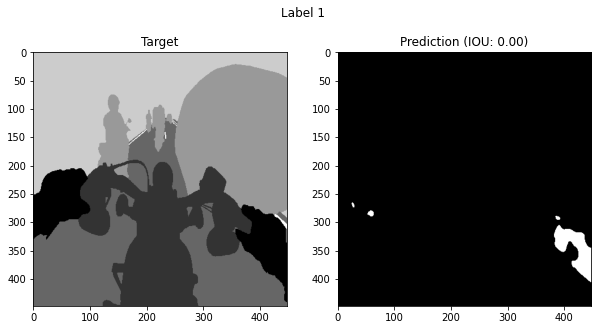

2번째 라벨 IOU: 0.0756613070539419


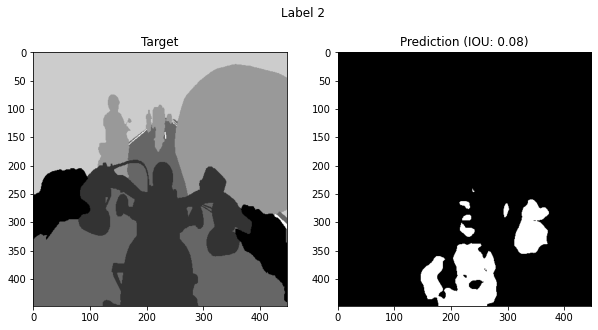

3번째 라벨 IOU: 0.2234374410723618


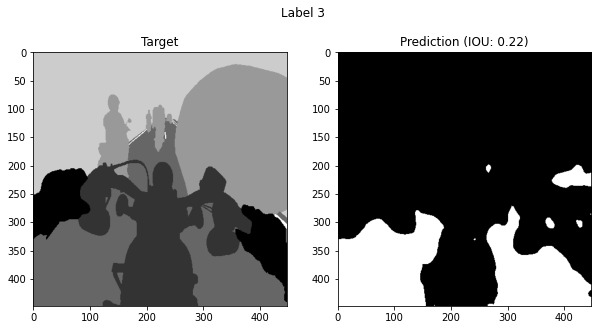

4번째 라벨 IOU: 0.13595322876085394


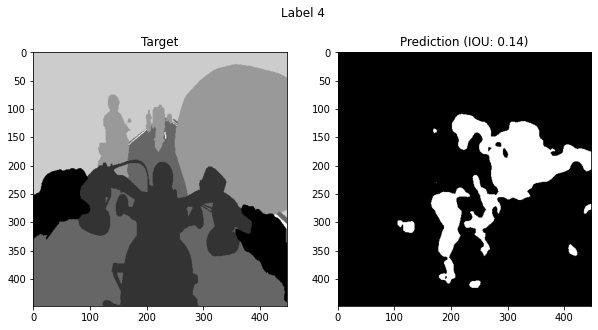

5번째 라벨 IOU: 0.47371773119991645


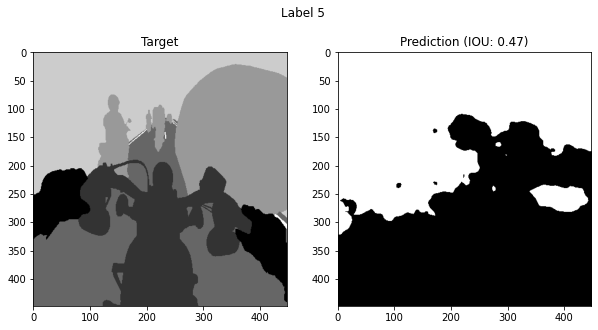

6번째 라벨 IOU: 0.0


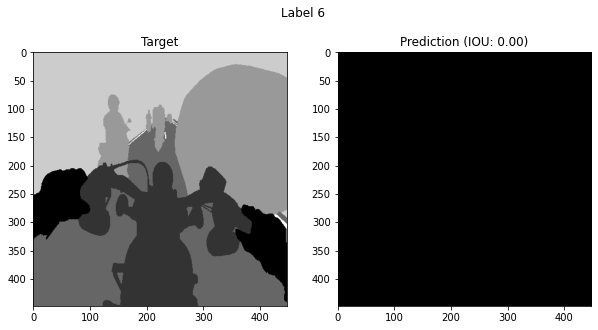

총합 가중치 IOU: 1.444044664790731
==========5번째 라벨별 점수==========
1번째 라벨 IOU: 0.004878441717976731


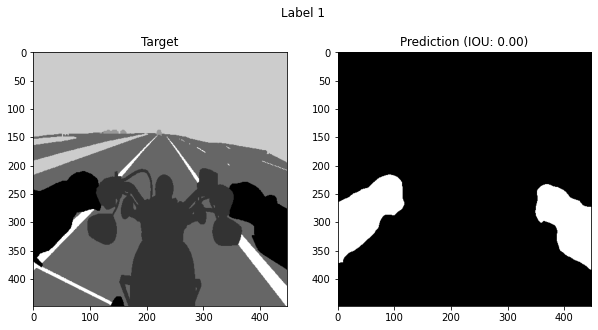

2번째 라벨 IOU: 0.19480103404847654


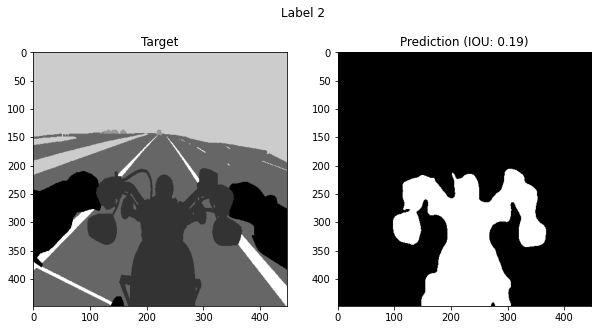

3번째 라벨 IOU: 0.3569999668431349


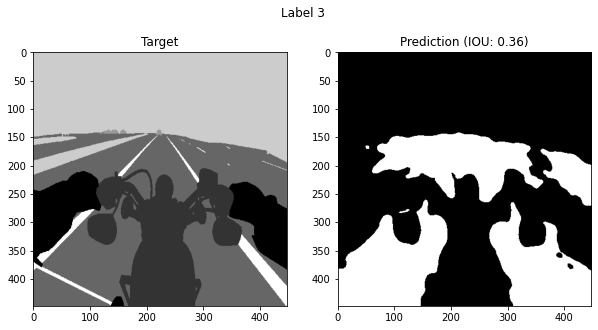

4번째 라벨 IOU: 0.0


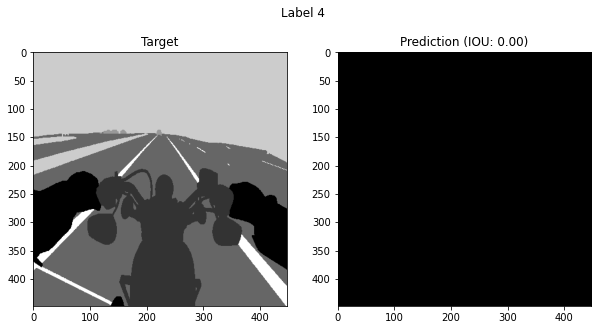

5번째 라벨 IOU: 0.43328627675883136


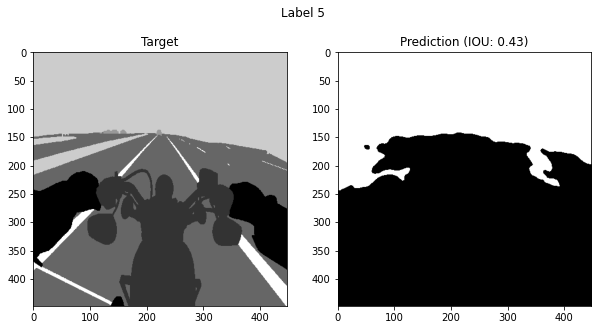

6번째 라벨 IOU: 0.0002710761724044456


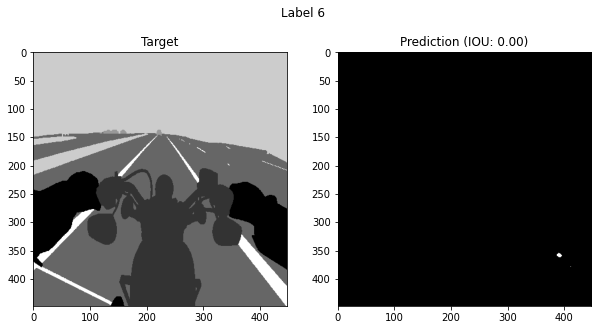

총합 가중치 IOU: 1.7651389869892309
==========6번째 라벨별 점수==========
1번째 라벨 IOU: 0.006836744983361904


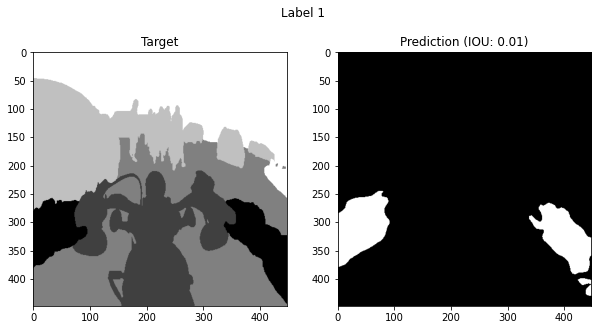

2번째 라벨 IOU: 0.1512398936458842


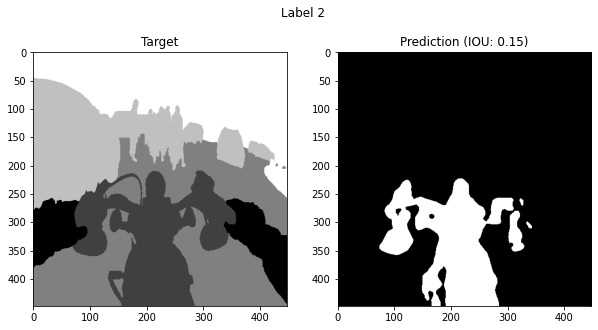

3번째 라벨 IOU: 0.29006320700973875


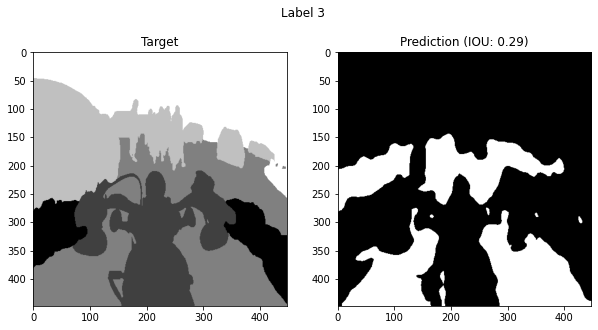

4번째 라벨 IOU: 0.08938726515270845


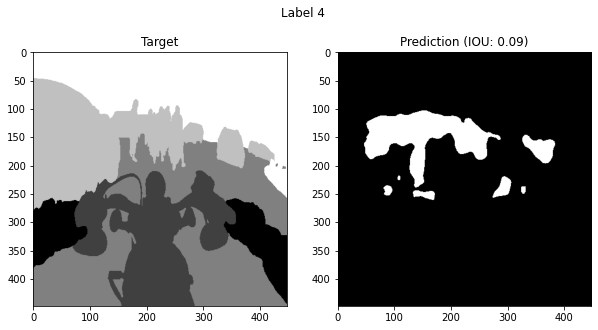

5번째 라벨 IOU: 0.41127986412940265


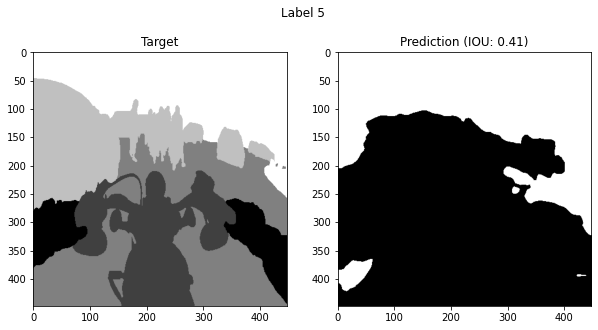

6번째 라벨 IOU: 0.0


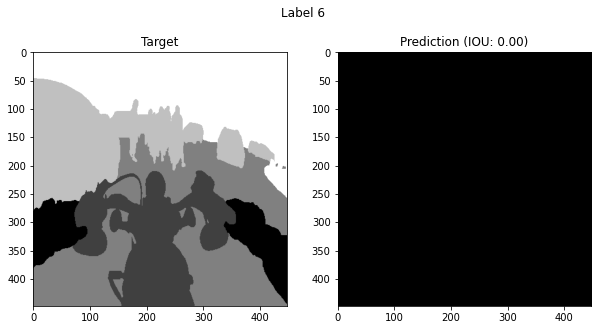

총합 가중치 IOU: 2.027399777191117
==========7번째 라벨별 점수==========
1번째 라벨 IOU: 0.005396817128122314


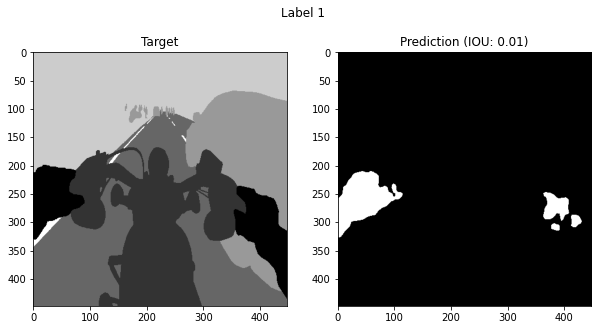

2번째 라벨 IOU: 0.1341898992530832


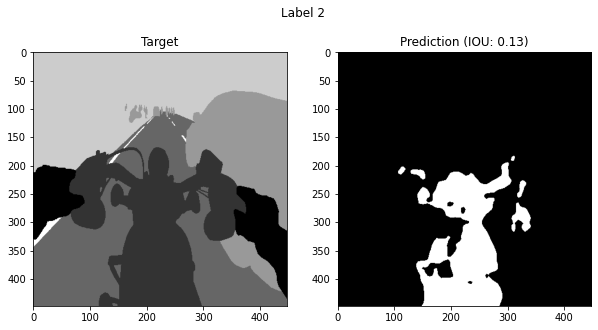

3번째 라벨 IOU: 0.2686074397496424


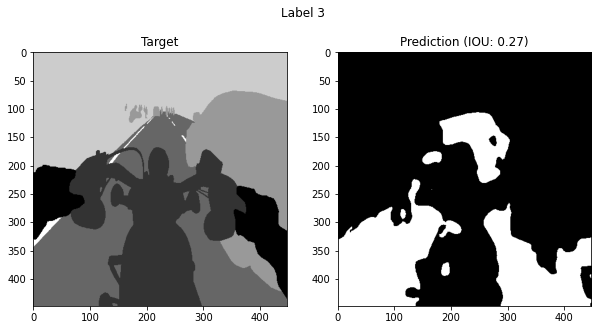

4번째 라벨 IOU: 0.000759944415494181


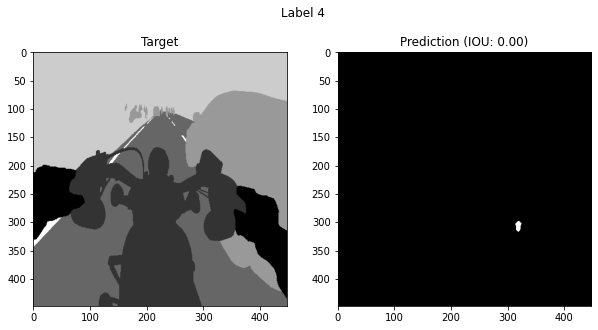

5번째 라벨 IOU: 0.5119176366030987


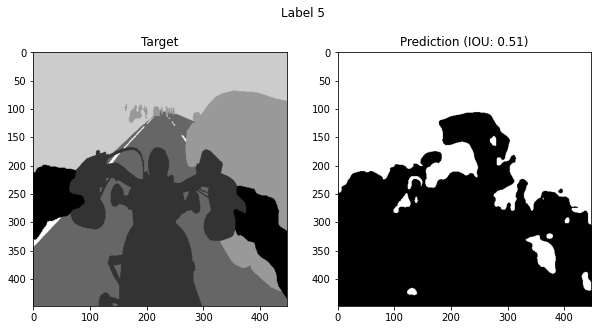

6번째 라벨 IOU: 0.0002551241966301893


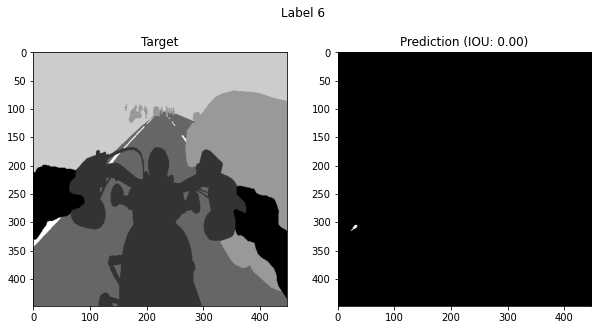

총합 가중치 IOU: 2.3637677010229745
==========8번째 라벨별 점수==========
1번째 라벨 IOU: 0.03478374546222459


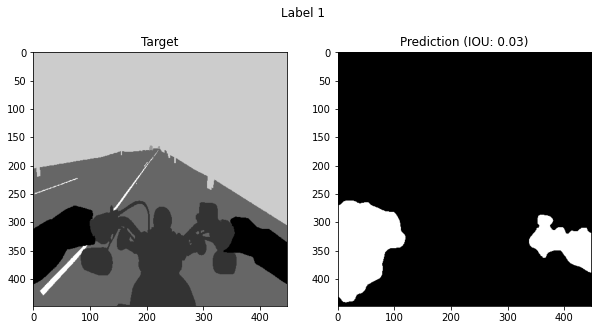

2번째 라벨 IOU: 0.2758228795803058


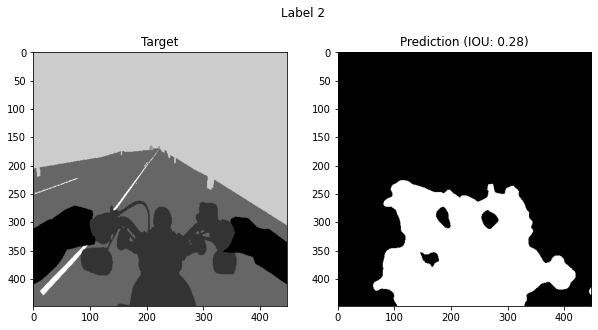

3번째 라벨 IOU: 0.06045041059231043


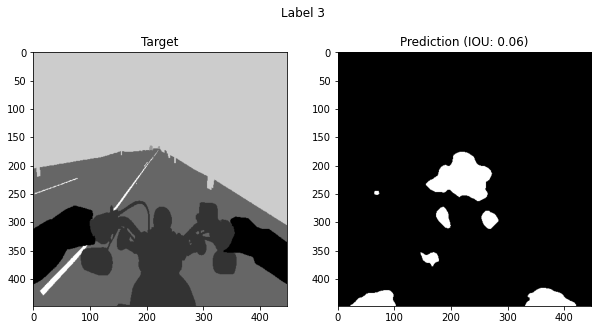

4번째 라벨 IOU: 0.011076820148698083


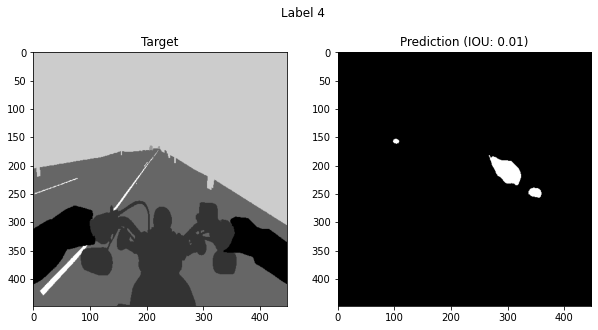

5번째 라벨 IOU: 0.5258117426163524


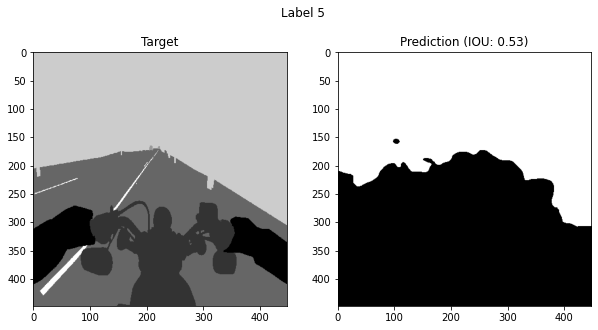

6번째 라벨 IOU: 0.0


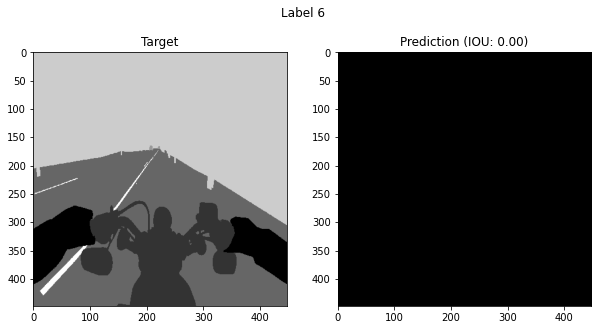

총합 가중치 IOU: 2.6969289991616314
==========9번째 라벨별 점수==========
1번째 라벨 IOU: 0.006578783050017733


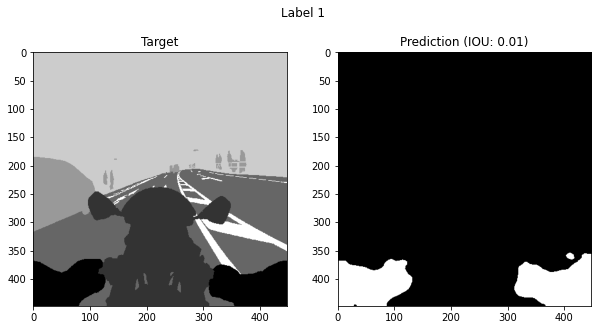

2번째 라벨 IOU: 0.14537792278412182


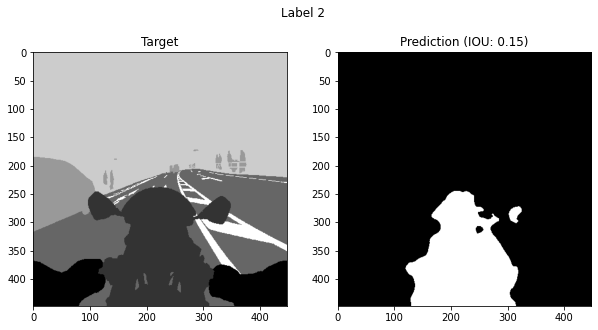

3번째 라벨 IOU: 0.11331104406208377


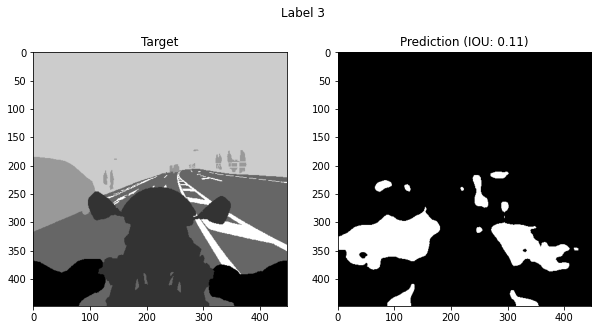

4번째 라벨 IOU: 0.07455291097380559


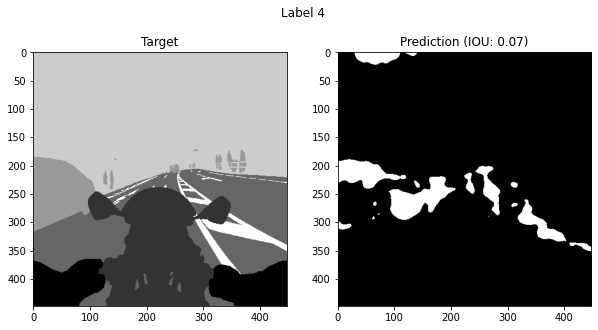

5번째 라벨 IOU: 0.5869919937342268


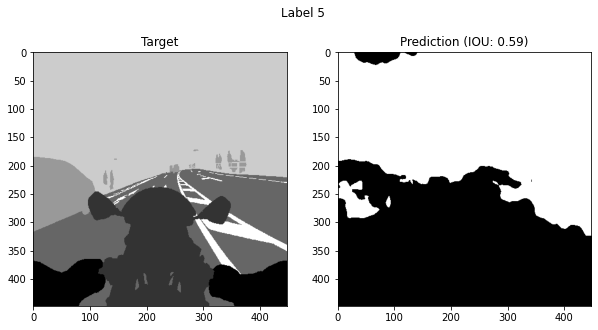

6번째 라벨 IOU: 0.0


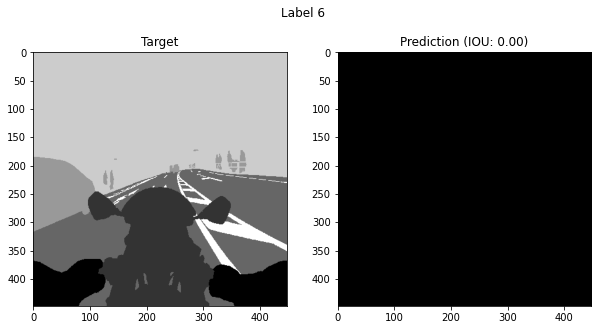

총합 가중치 IOU: 3.0494494491171857
==========10번째 라벨별 점수==========
1번째 라벨 IOU: 0.019231639213241985


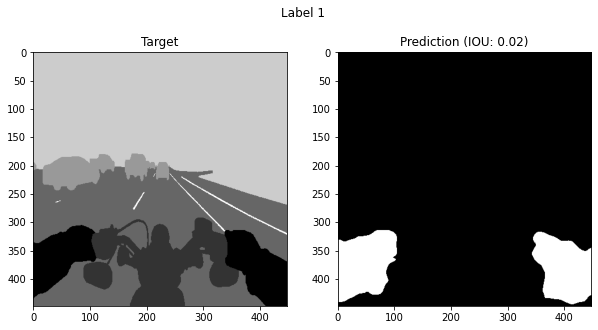

2번째 라벨 IOU: 0.17136554278555477


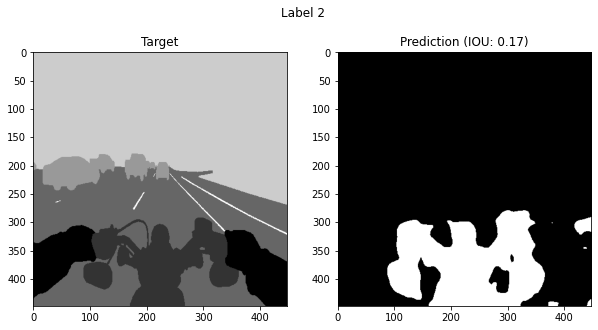

3번째 라벨 IOU: 0.16934981815004532


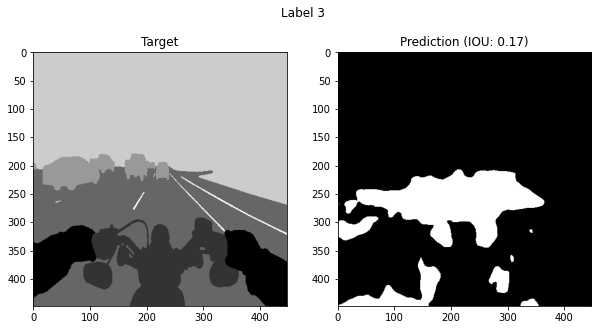

4번째 라벨 IOU: 0.03938513306821658


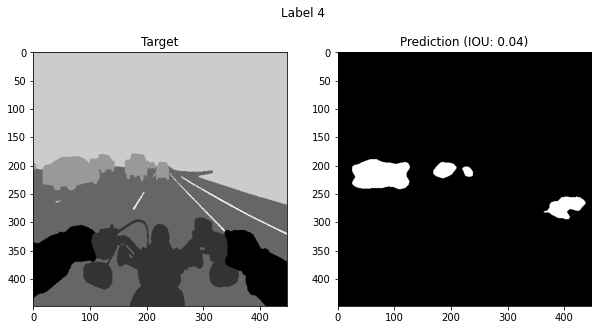

5번째 라벨 IOU: 0.5411877813223791


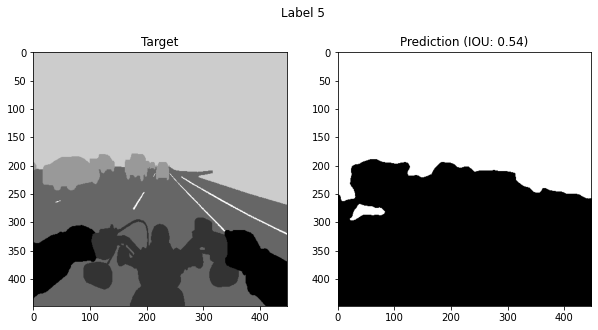

6번째 라벨 IOU: 0.0


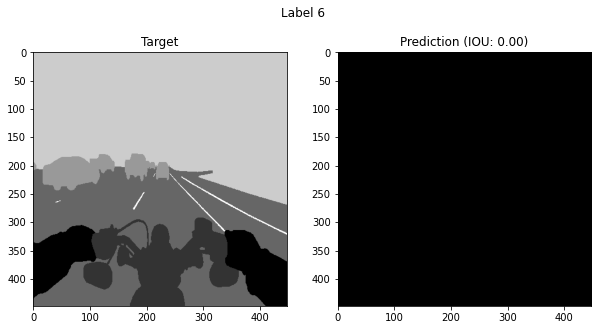

총합 가중치 IOU: 3.3734180987166074
==========11번째 라벨별 점수==========
1번째 라벨 IOU: 0.03515078470930385


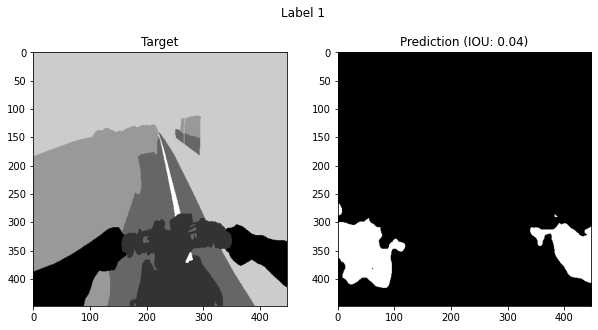

2번째 라벨 IOU: 0.21546359514254443


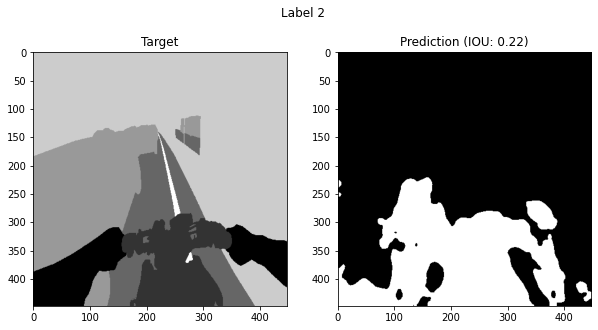

3번째 라벨 IOU: 0.12385794039902163


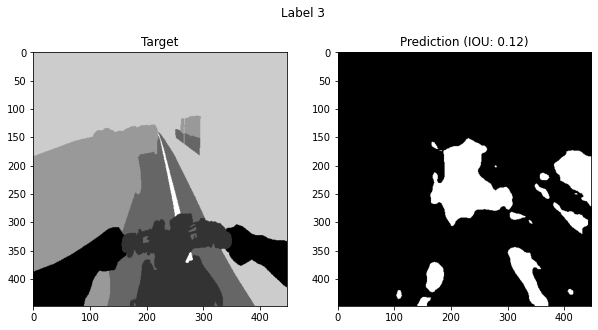

4번째 라벨 IOU: 0.14546521448235772


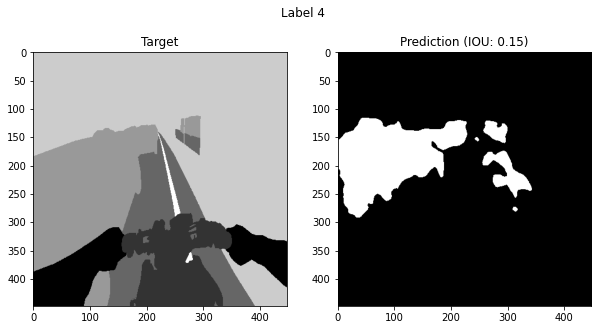

5번째 라벨 IOU: 0.36386868919526616


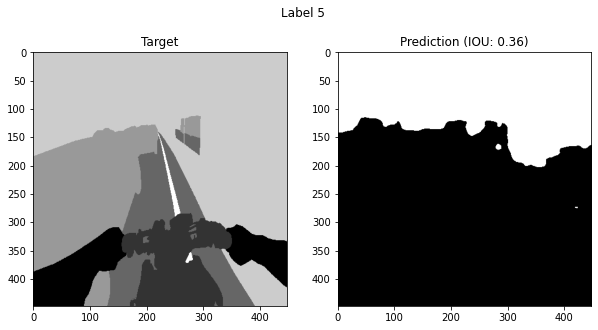

6번째 라벨 IOU: 0.0


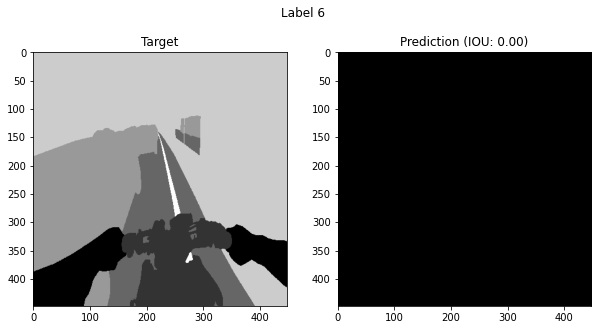

총합 가중치 IOU: 3.5841374972752567
==========12번째 라벨별 점수==========
1번째 라벨 IOU: 0.011572713710953393


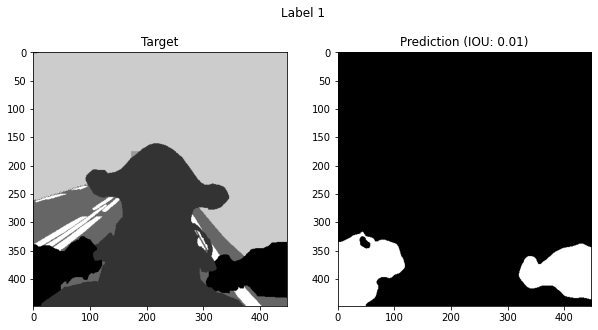

2번째 라벨 IOU: 0.24485124605047723


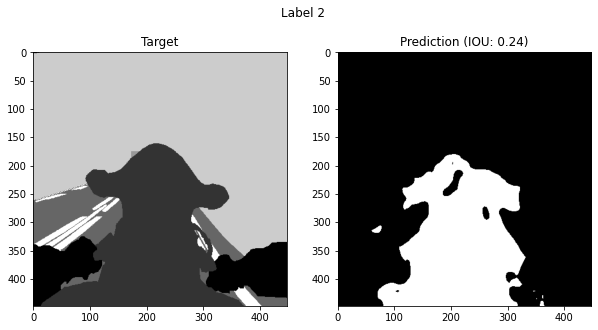

3번째 라벨 IOU: 0.12836995736306986


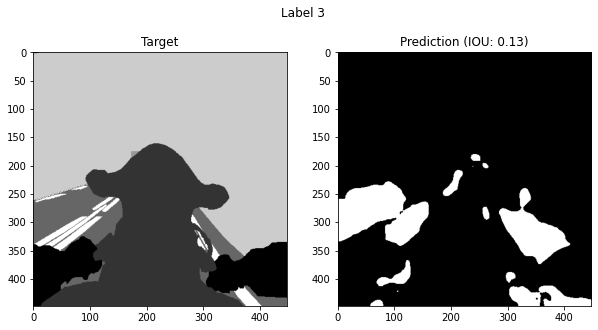

4번째 라벨 IOU: 0.003967404724668697


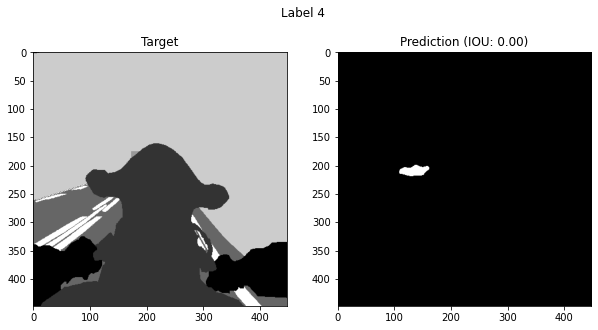

5번째 라벨 IOU: 0.586263627788624


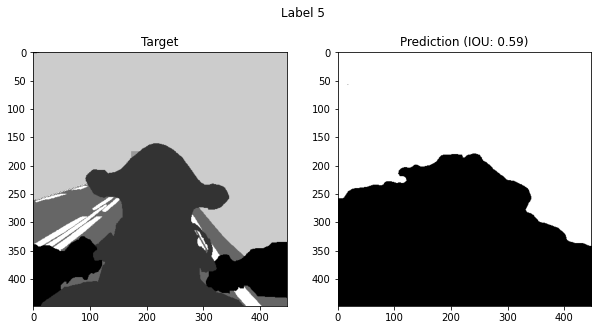

6번째 라벨 IOU: 0.00015364776250445853


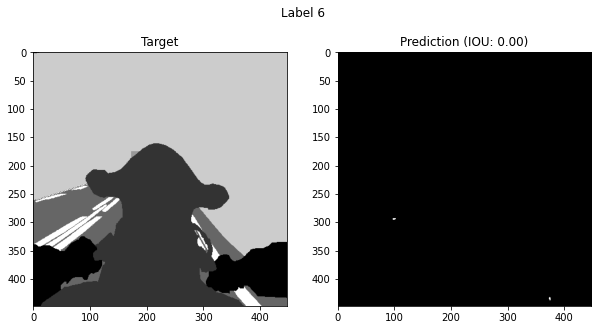

총합 가중치 IOU: 3.9683436422979295
==========13번째 라벨별 점수==========
1번째 라벨 IOU: 0.0


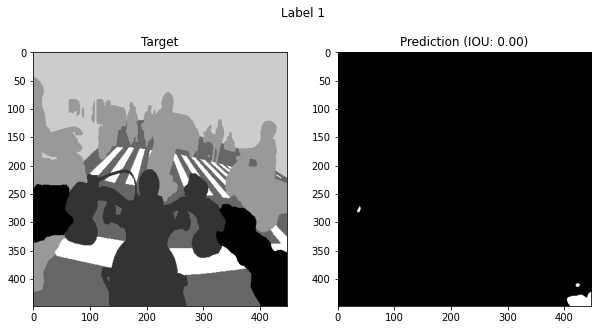

2번째 라벨 IOU: 0.010490714078866129


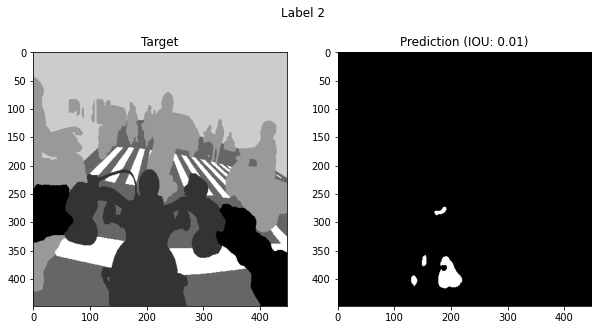

3번째 라벨 IOU: 0.20510510350416095


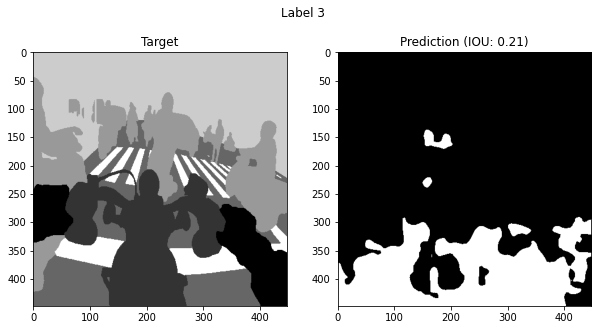

4번째 라벨 IOU: 0.02805719624738415


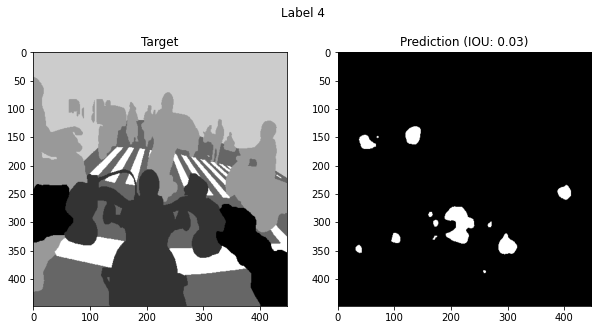

5번째 라벨 IOU: 0.6550760665771869


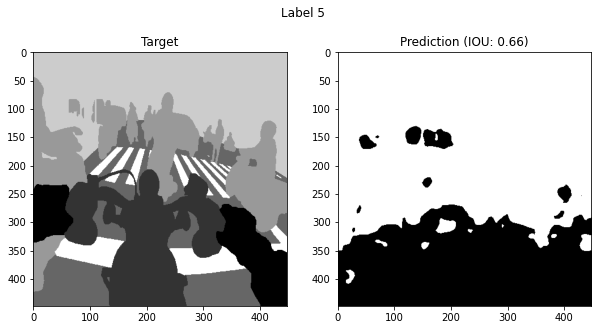

6번째 라벨 IOU: 0.0


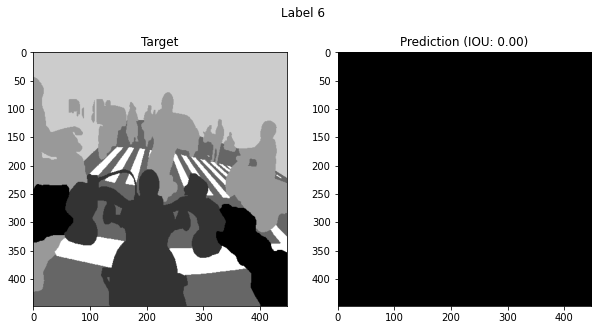

총합 가중치 IOU: 4.45013886380158
==========14번째 라벨별 점수==========
1번째 라벨 IOU: 0.029365126854954522


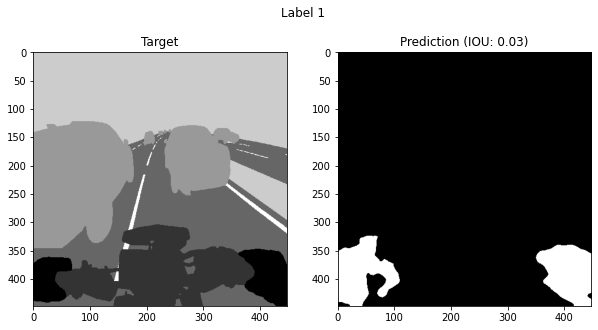

2번째 라벨 IOU: 0.15514754098360656


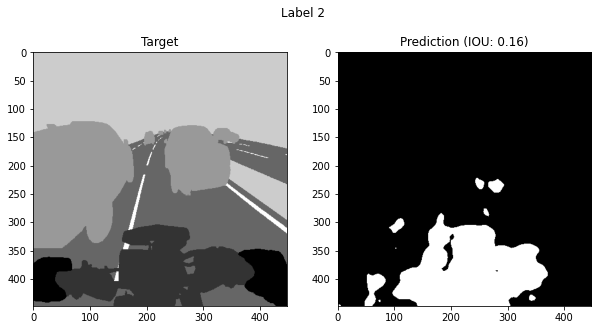

3번째 라벨 IOU: 0.1272534520129526


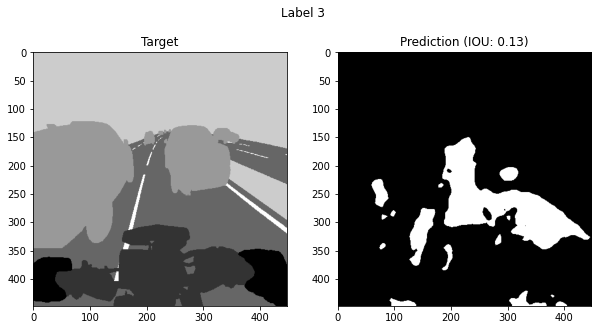

4번째 라벨 IOU: 0.05733674117381561


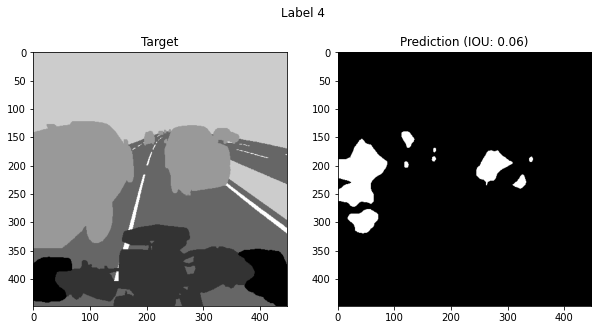

5번째 라벨 IOU: 0.5212788848594265


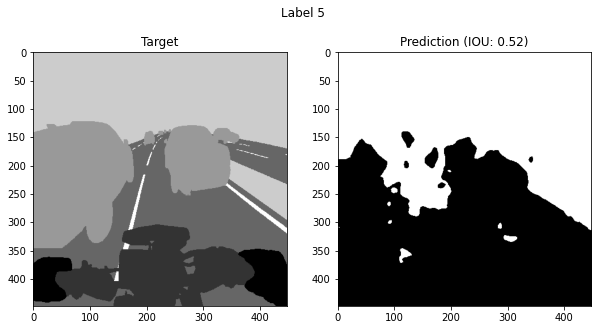

6번째 라벨 IOU: 0.0


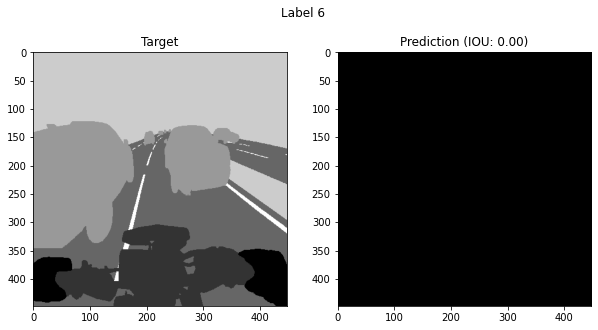

총합 가중치 IOU: 4.751857489743047
==========15번째 라벨별 점수==========
1번째 라벨 IOU: 0.001987613712031321


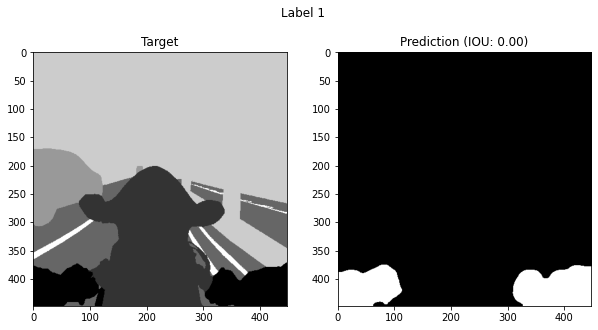

2번째 라벨 IOU: 0.1892795513373598


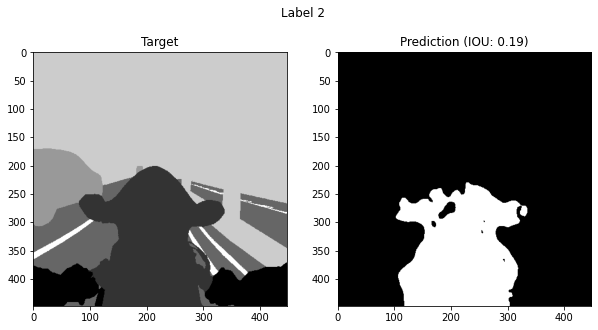

3번째 라벨 IOU: 0.1746526411137051


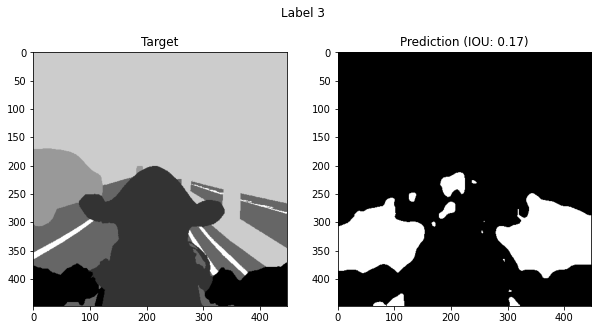

4번째 라벨 IOU: 0.017702462457918827


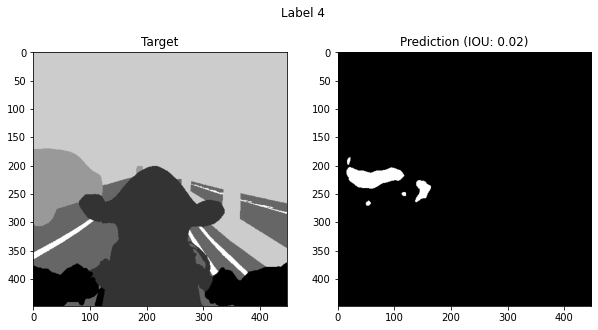

5번째 라벨 IOU: 0.5970366207533814


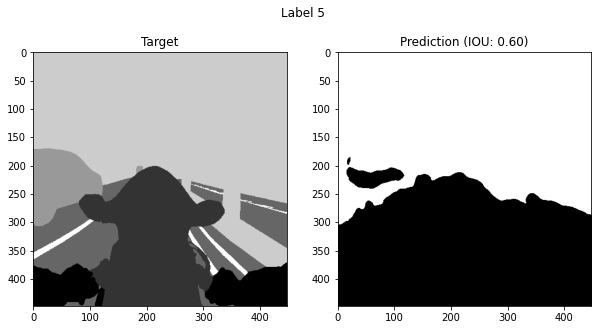

6번째 라벨 IOU: 0.0


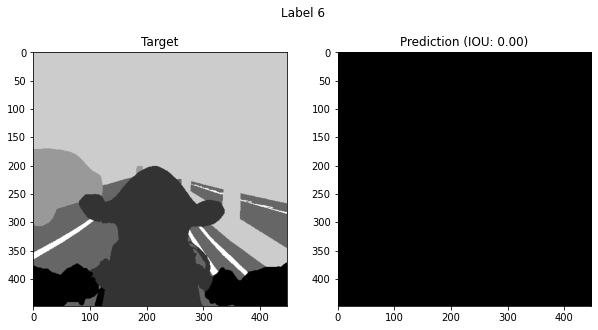

총합 가중치 IOU: 5.14297101669635
==========16번째 라벨별 점수==========
1번째 라벨 IOU: 0.012149456215917578


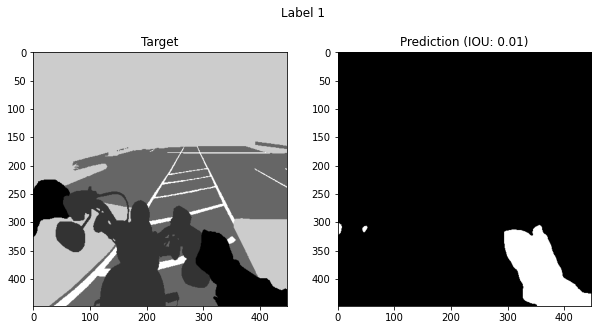

2번째 라벨 IOU: 0.12759596046504124


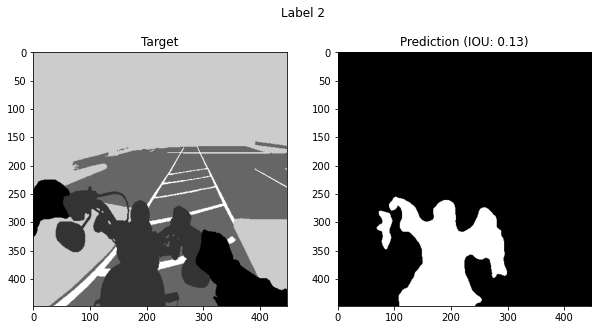

3번째 라벨 IOU: 0.28281916065947416


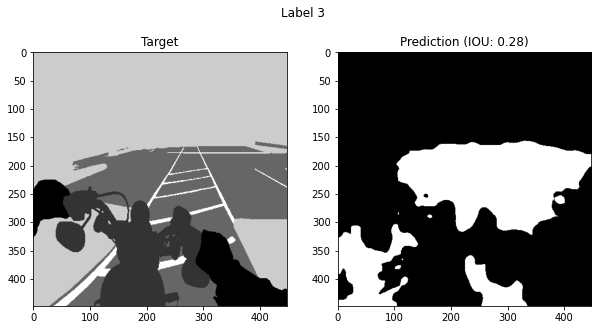

4번째 라벨 IOU: 0.0


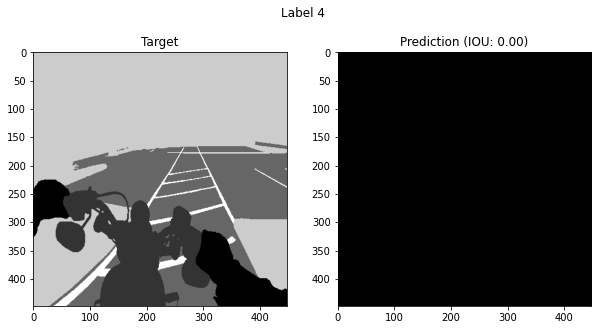

5번째 라벨 IOU: 0.5195084727923377


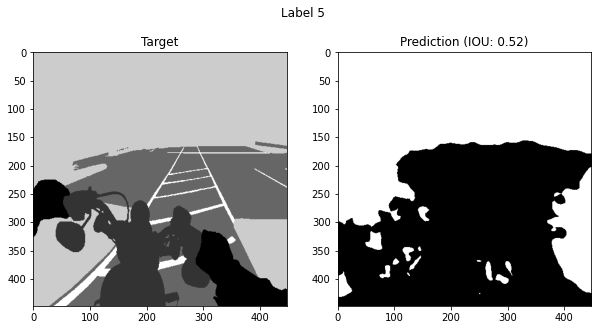

6번째 라벨 IOU: 0.0001506688621272291


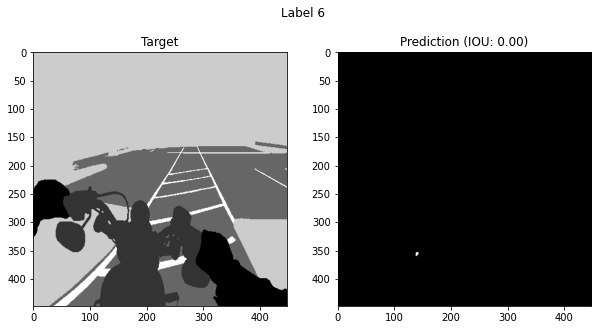

총합 가중치 IOU: 5.499613057840717
==========17번째 라벨별 점수==========
1번째 라벨 IOU: 0.021980537482895267


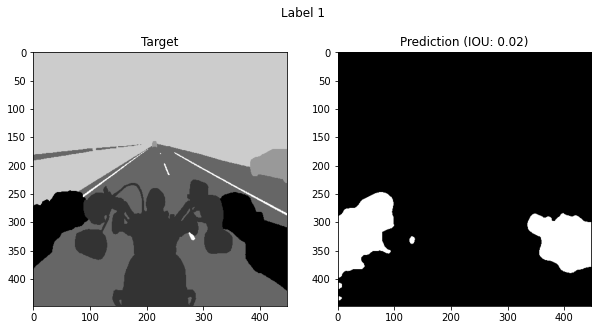

2번째 라벨 IOU: 0.3071406417490573


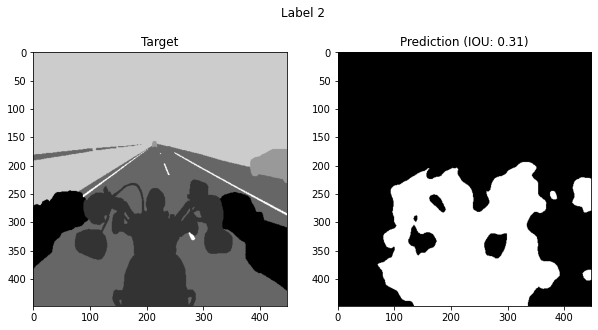

3번째 라벨 IOU: 0.07346741877305793


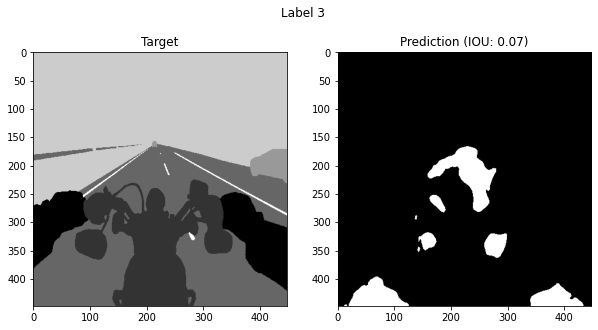

4번째 라벨 IOU: 0.0


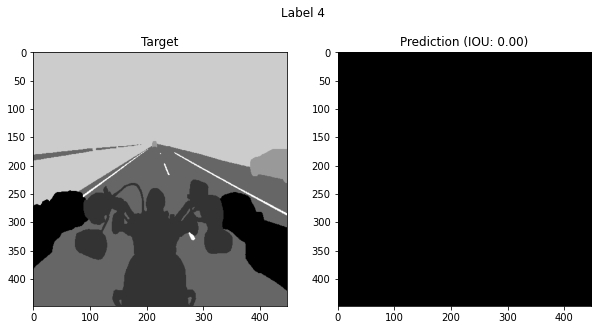

5번째 라벨 IOU: 0.5197877611874849


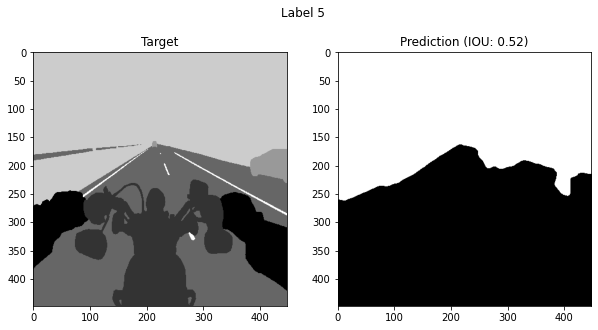

6번째 라벨 IOU: 0.0


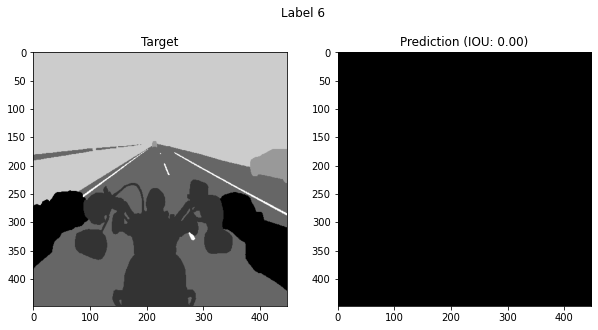

총합 가중치 IOU: 5.84062800976325
==========18번째 라벨별 점수==========
1번째 라벨 IOU: 0.011737385465835373


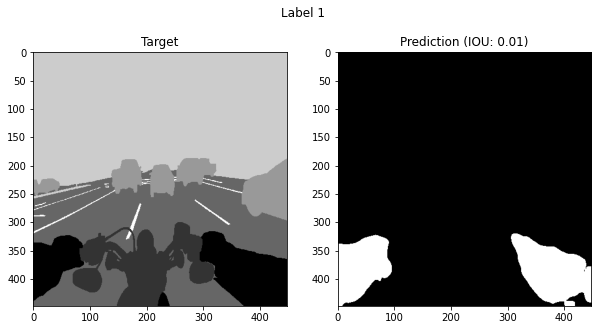

2번째 라벨 IOU: 0.10641159356644893


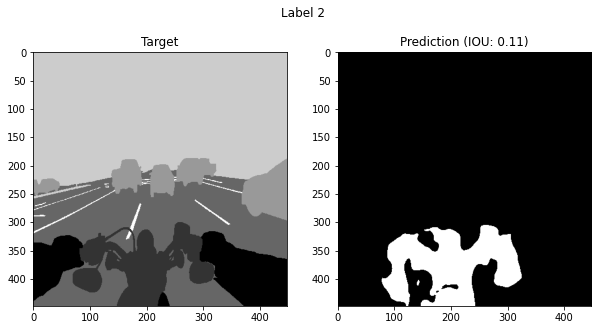

3번째 라벨 IOU: 0.21540303580394732


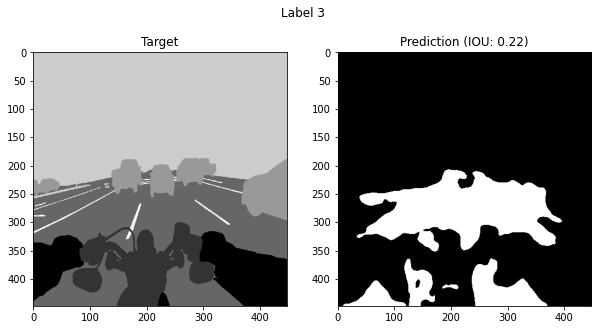

4번째 라벨 IOU: 0.033854396818382676


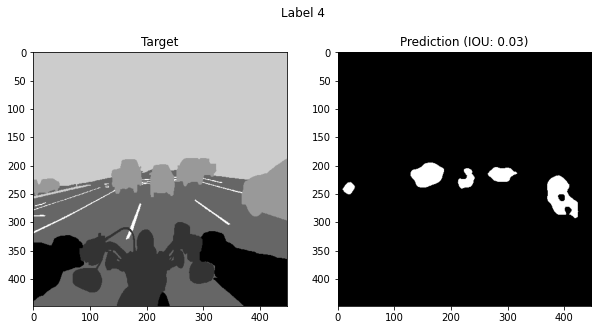

5번째 라벨 IOU: 0.5882733097657976


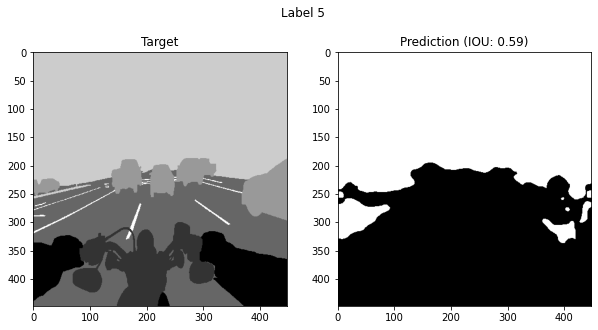

6번째 라벨 IOU: 0.0


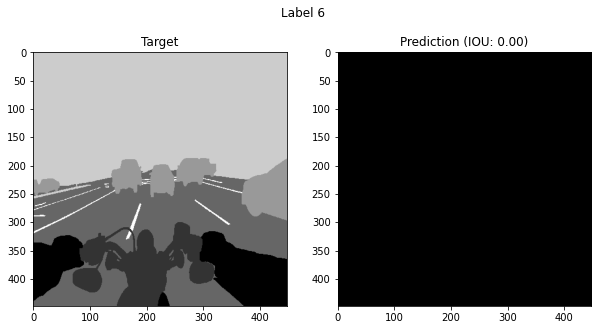

총합 가중치 IOU: 6.207940718392673
==========19번째 라벨별 점수==========
1번째 라벨 IOU: 0.012023406097799045


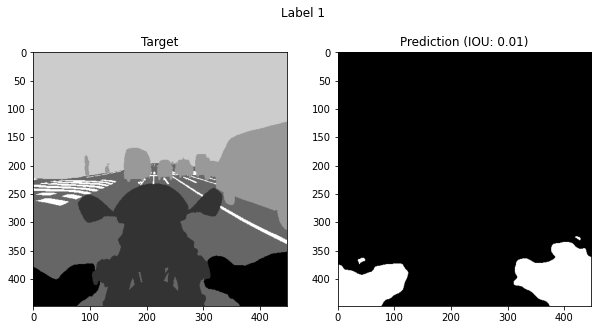

2번째 라벨 IOU: 0.15966592439742802


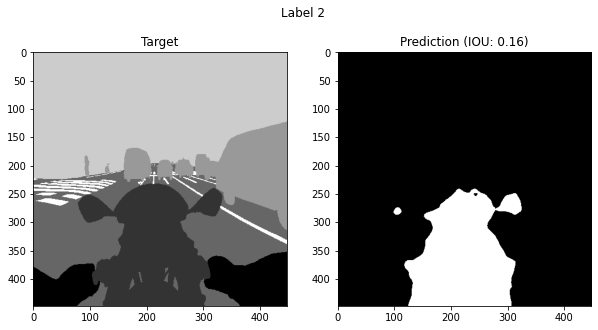

3번째 라벨 IOU: 0.14819166993080038


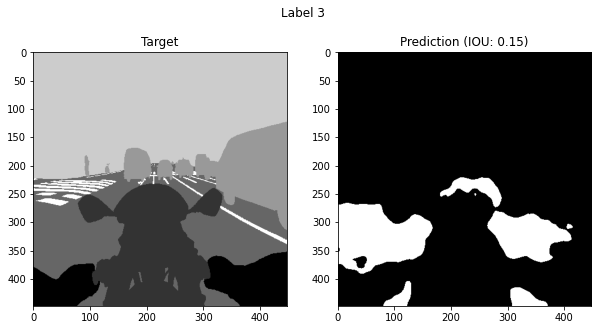

4번째 라벨 IOU: 0.007272271672459063


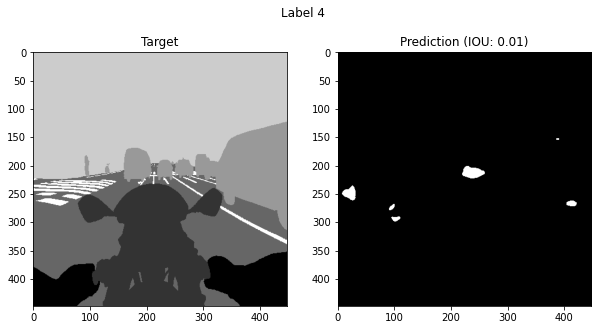

5번째 라벨 IOU: 0.6363047054593788


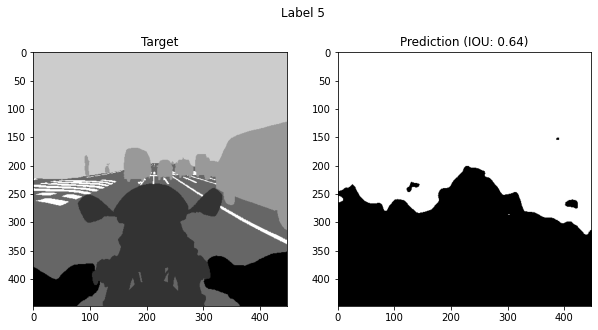

6번째 라벨 IOU: 0.0


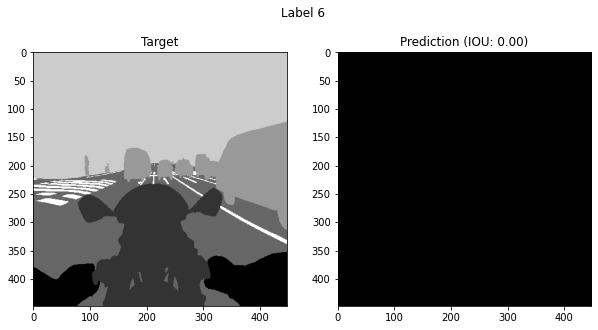

총합 가중치 IOU: 6.623129126494757
==========20번째 라벨별 점수==========
1번째 라벨 IOU: 0.017463449182981736


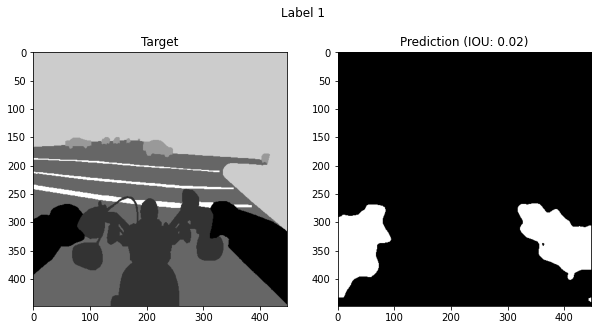

2번째 라벨 IOU: 0.34079483341831


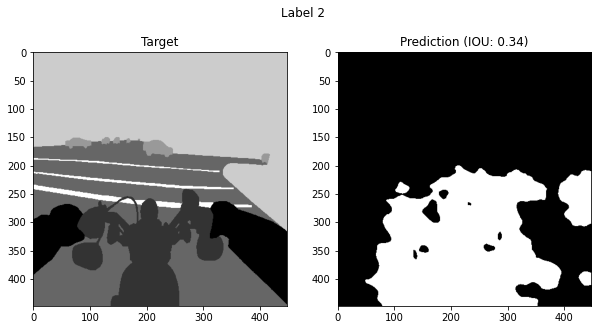

3번째 라벨 IOU: 0.10182871328092677


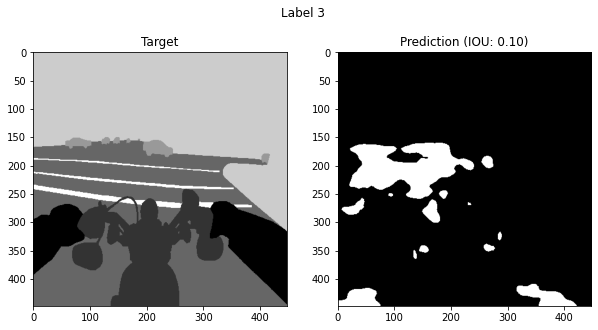

4번째 라벨 IOU: 0.047121545772141


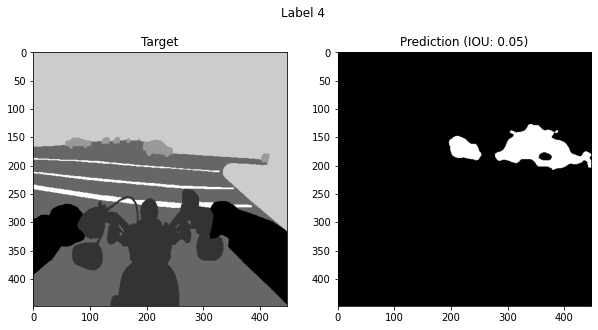

5번째 라벨 IOU: 0.4028014636488567


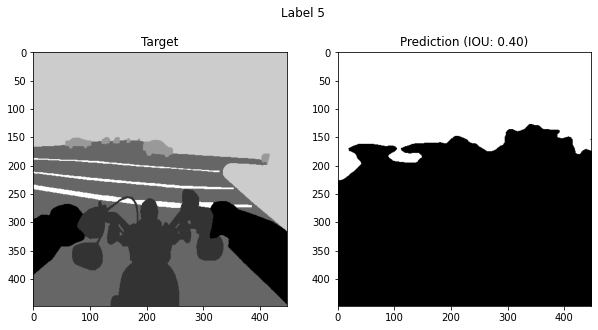

6번째 라벨 IOU: 0.0


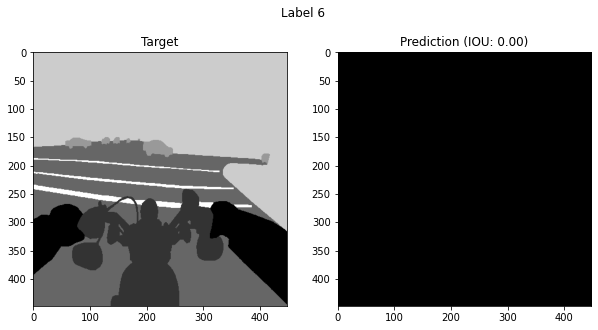

총합 가중치 IOU: 6.890359432765868
==========21번째 라벨별 점수==========
1번째 라벨 IOU: 0.002143595041322314


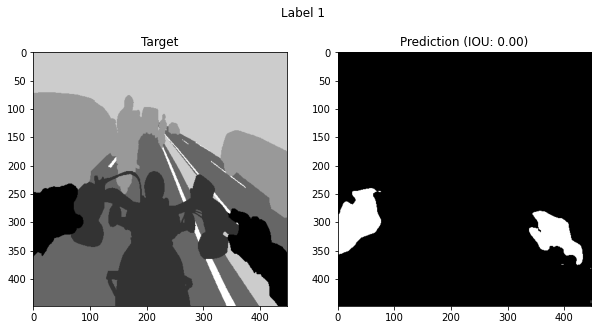

2번째 라벨 IOU: 0.12103788643841418


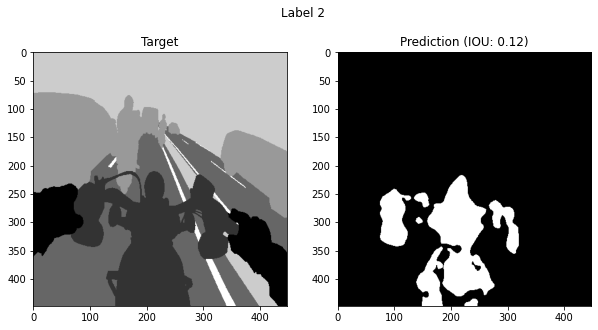

3번째 라벨 IOU: 0.25906226230576984


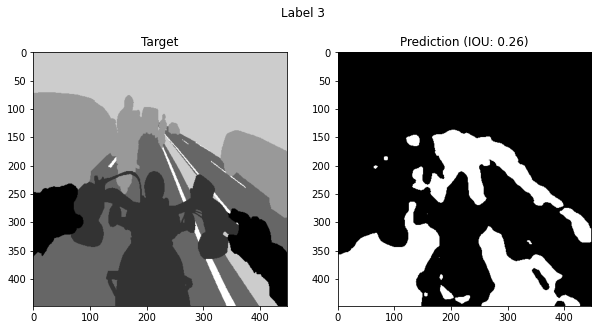

4번째 라벨 IOU: 0.014478098003077207


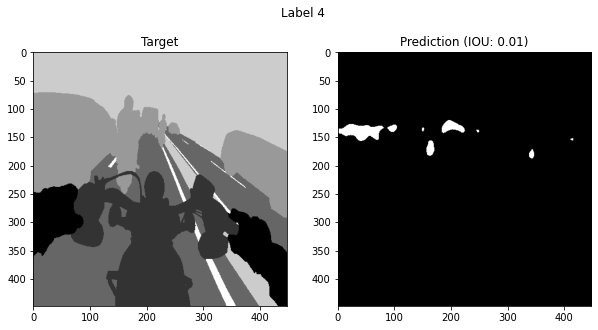

5번째 라벨 IOU: 0.5351208479217759


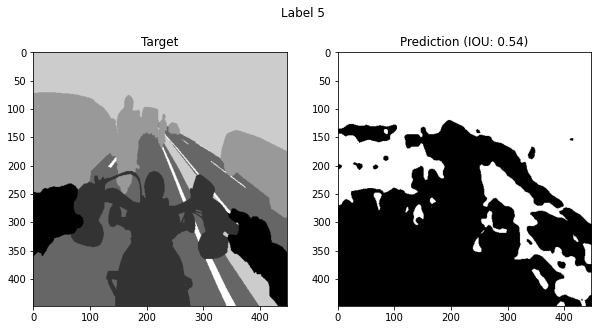

6번째 라벨 IOU: 0.0


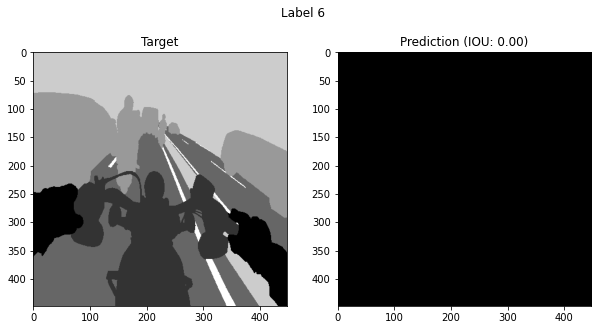

총합 가중치 IOU: 7.248275097418648
==========22번째 라벨별 점수==========
1번째 라벨 IOU: 0.017485316336638617


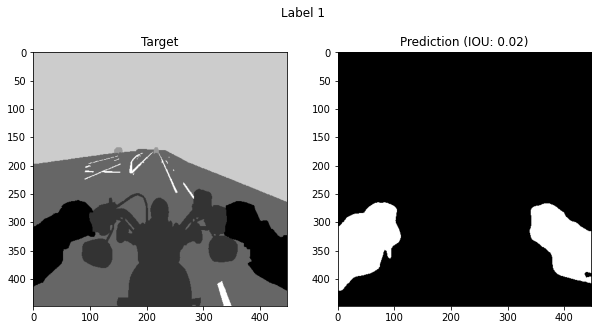

2번째 라벨 IOU: 0.18243606481837032


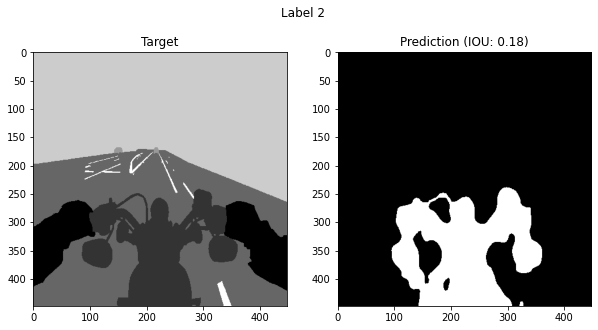

3번째 라벨 IOU: 0.253285504289256


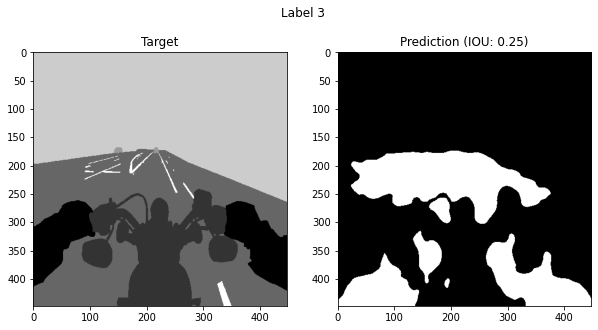

4번째 라벨 IOU: 0.0009546120379869756


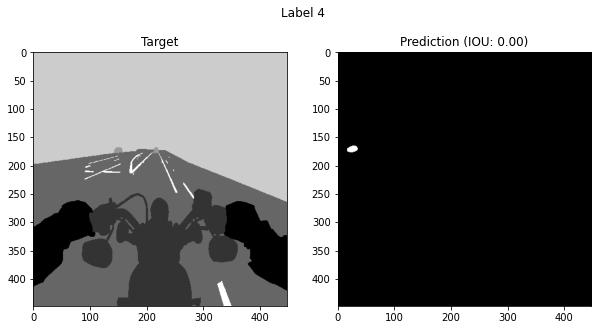

5번째 라벨 IOU: 0.5055896873285792


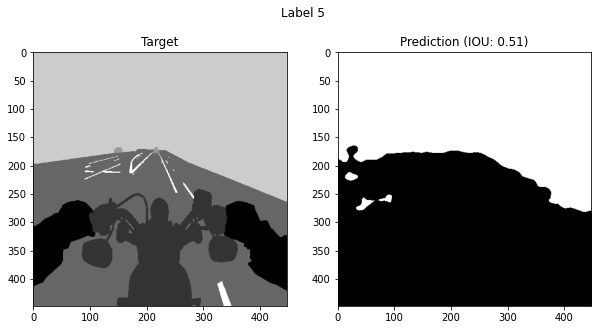

6번째 라벨 IOU: 0.0


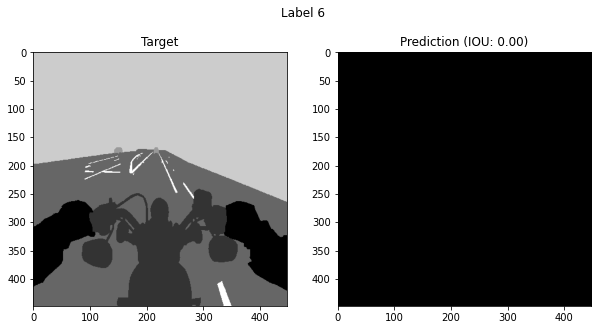

총합 가중치 IOU: 7.570943004835481
==========23번째 라벨별 점수==========
1번째 라벨 IOU: 0.0075003368414749165


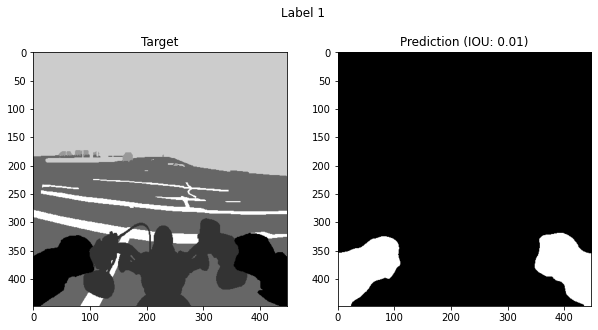

2번째 라벨 IOU: 0.13431236163060717


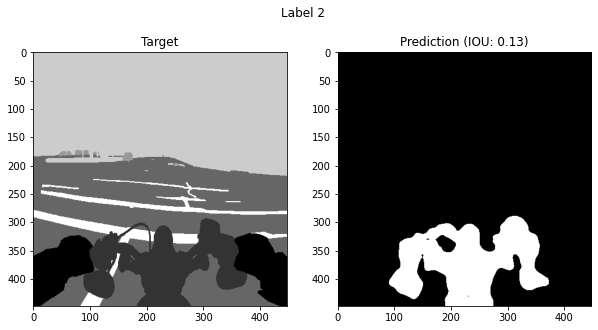

3번째 라벨 IOU: 0.3017438683252263


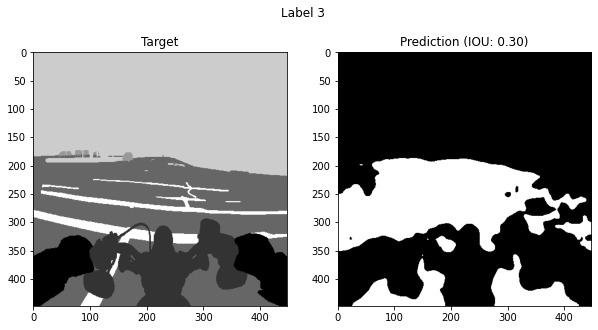

4번째 라벨 IOU: 0.0007037754847930359


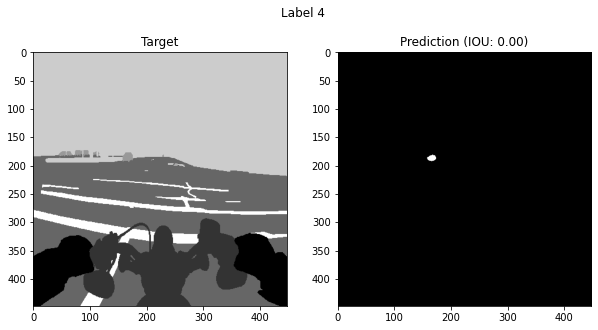

5번째 라벨 IOU: 0.5266243679554781


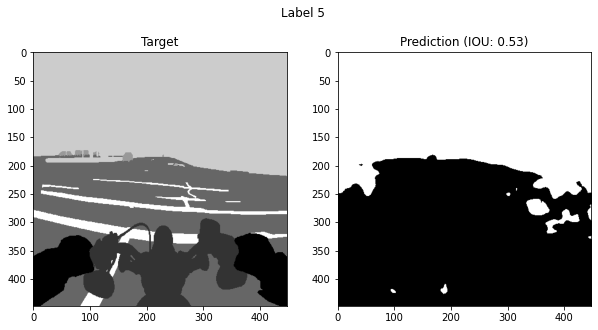

6번째 라벨 IOU: 0.0


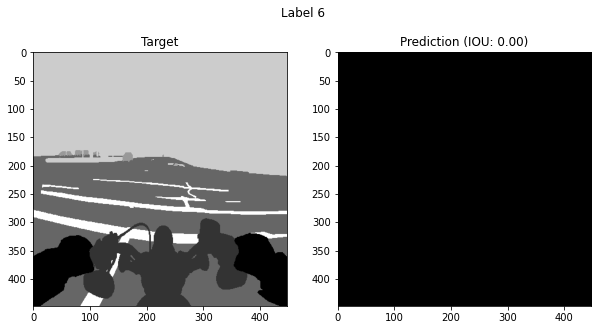

총합 가중치 IOU: 7.927444449305582
==========24번째 라벨별 점수==========
1번째 라벨 IOU: 0.014598797805389705


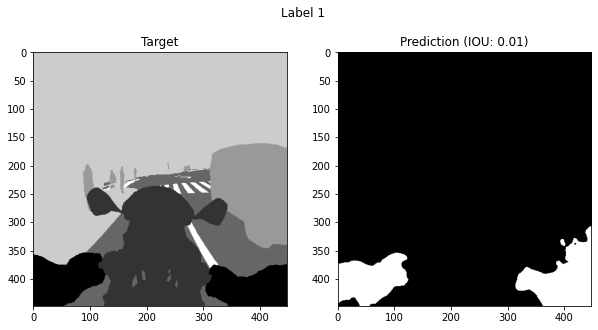

2번째 라벨 IOU: 0.16206557038181393


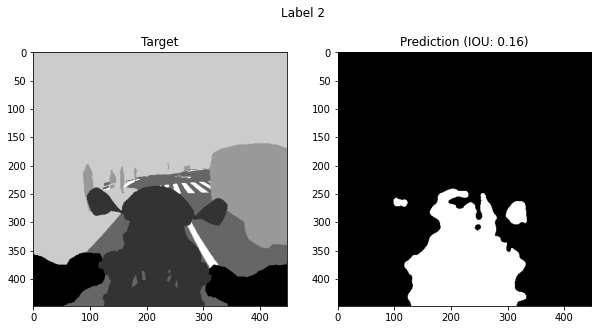

3번째 라벨 IOU: 0.09937651031239943


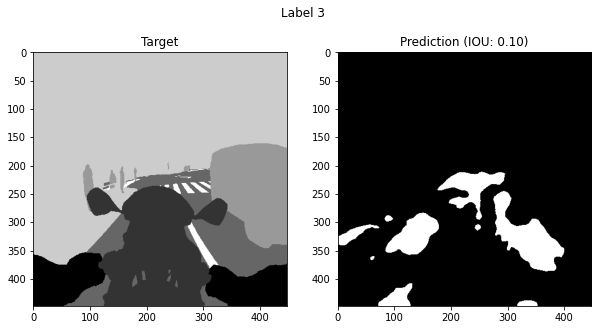

4번째 라벨 IOU: 0.013907158256692956


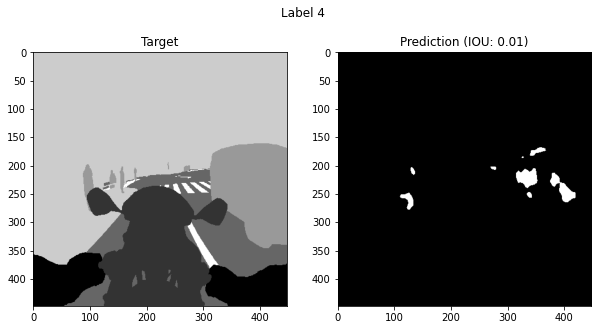

5번째 라벨 IOU: 0.6482515459641195


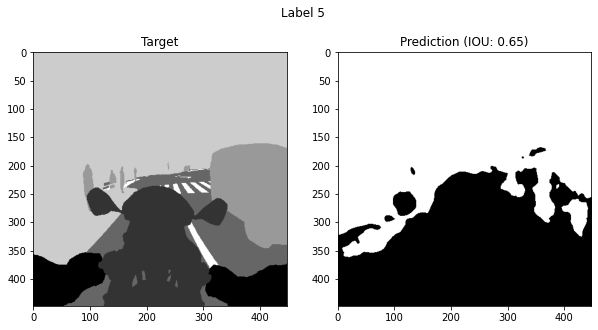

6번째 라벨 IOU: 0.0


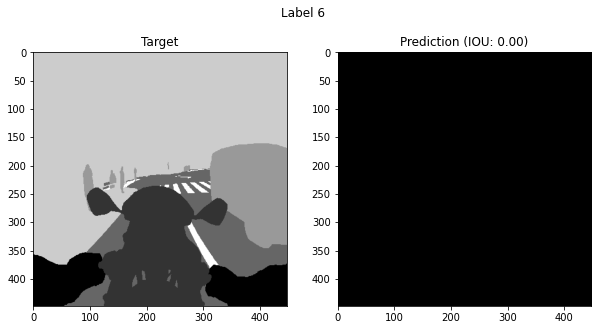

총합 가중치 IOU: 8.346192734498057
==========25번째 라벨별 점수==========
1번째 라벨 IOU: 0.021001997012182288


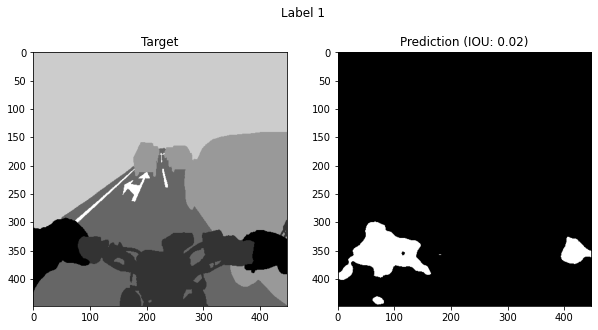

2번째 라벨 IOU: 0.18565947044322273


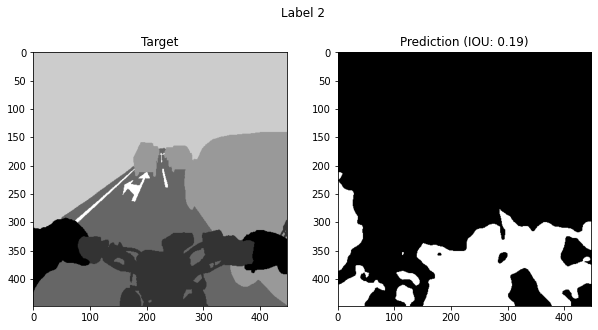

3번째 라벨 IOU: 0.1214985383594737


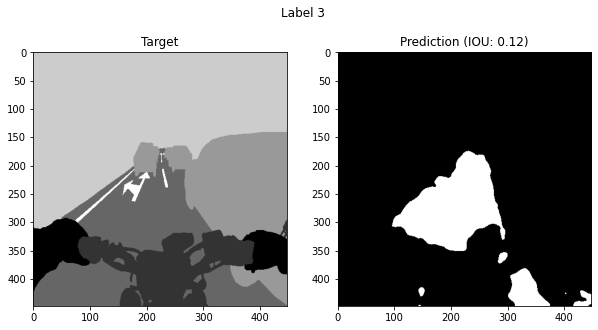

4번째 라벨 IOU: 0.10127345100464659


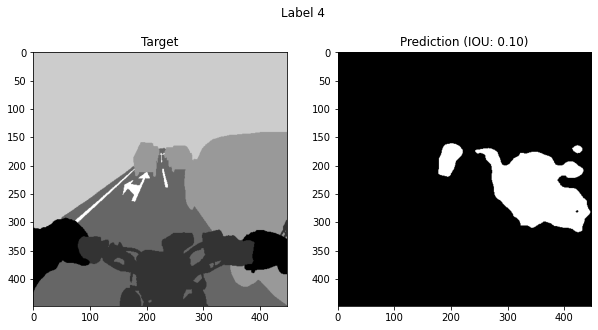

5번째 라벨 IOU: 0.4917499947149229


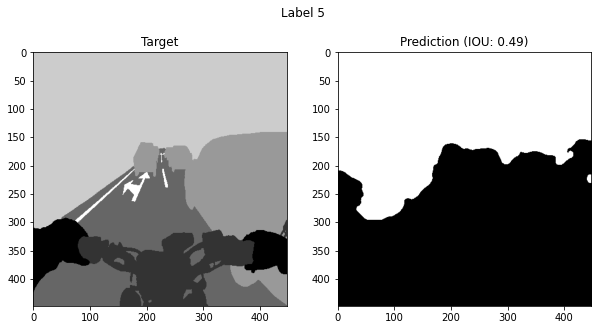

6번째 라벨 IOU: 0.0


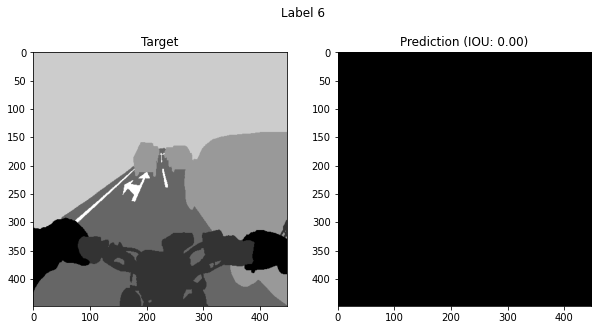

총합 가중치 IOU: 8.636535115189476
==========26번째 라벨별 점수==========
1번째 라벨 IOU: 0.01620802122502718


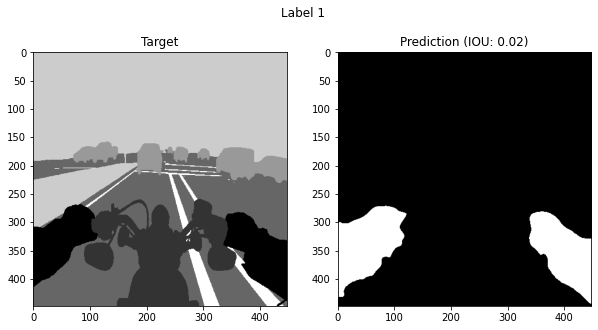

2번째 라벨 IOU: 0.14307469858321742


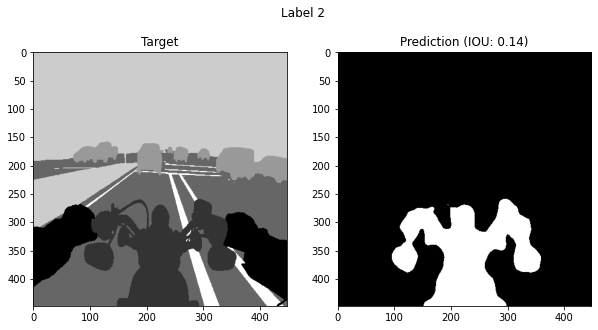

3번째 라벨 IOU: 0.3239469908921514


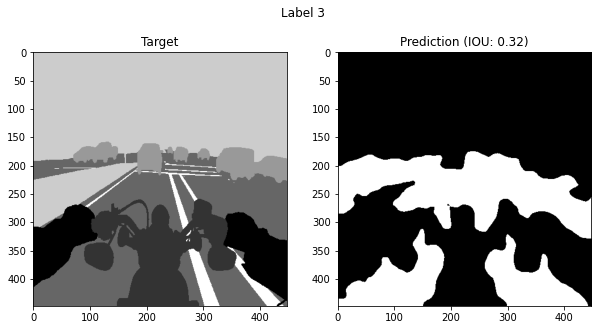

4번째 라벨 IOU: 0.03687391058104177


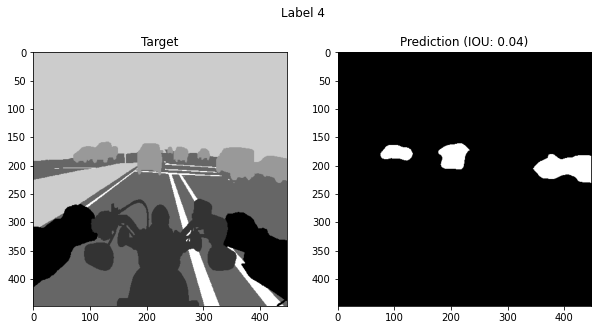

5번째 라벨 IOU: 0.46029555675283407


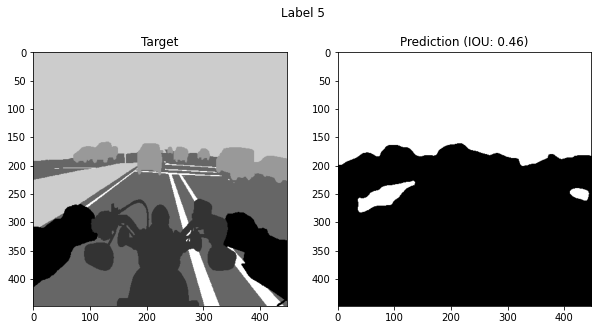

6번째 라벨 IOU: 0.0


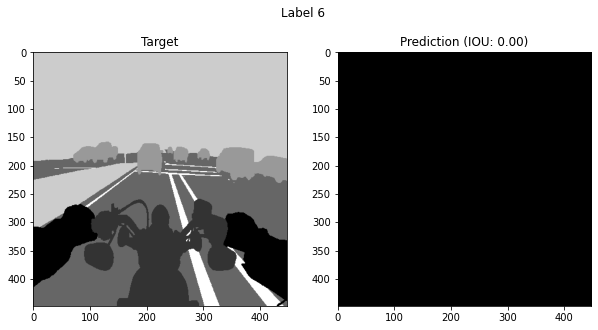

총합 가중치 IOU: 8.94542969675622
==========27번째 라벨별 점수==========
1번째 라벨 IOU: 0.0032174223419818315


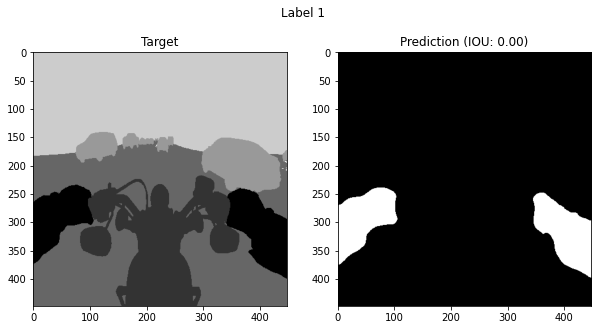

2번째 라벨 IOU: 0.17691050848201068


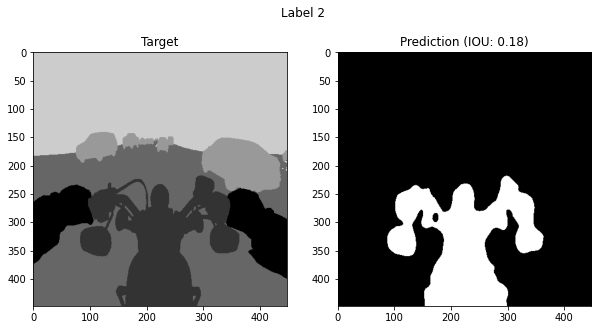

3번째 라벨 IOU: 0.31973822218337555


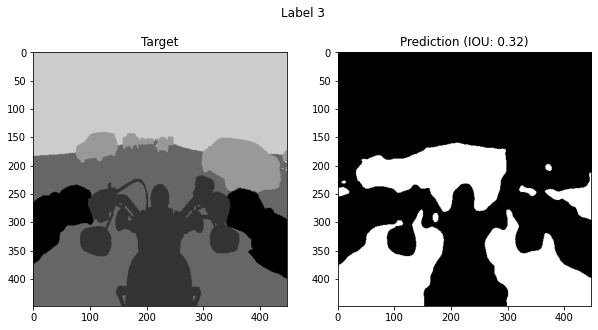

4번째 라벨 IOU: 0.04962512409023348


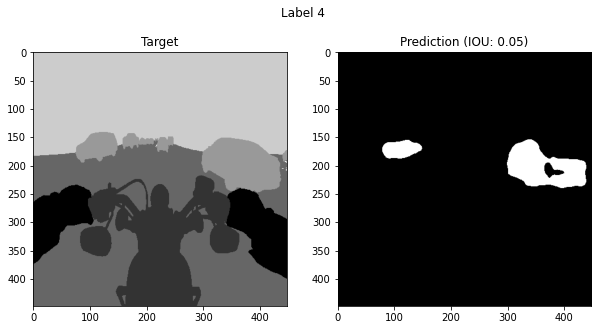

5번째 라벨 IOU: 0.4339075894935773


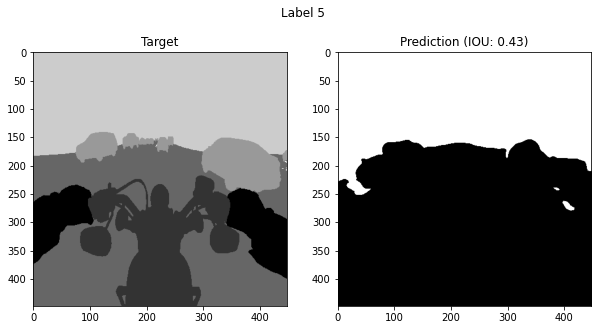

6번째 라벨 IOU: 0.0


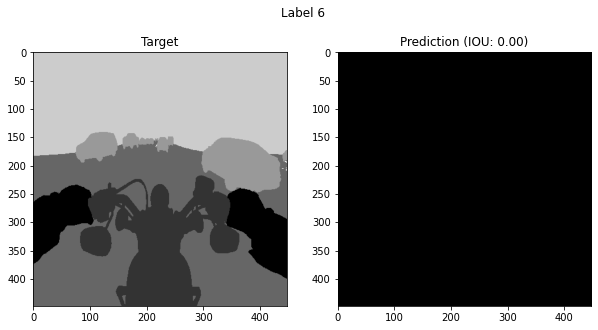

총합 가중치 IOU: 9.242584027084146
==========28번째 라벨별 점수==========
1번째 라벨 IOU: 0.013052918473922129


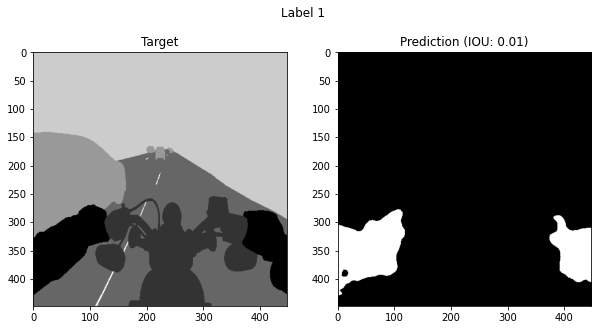

2번째 라벨 IOU: 0.21644967519230246


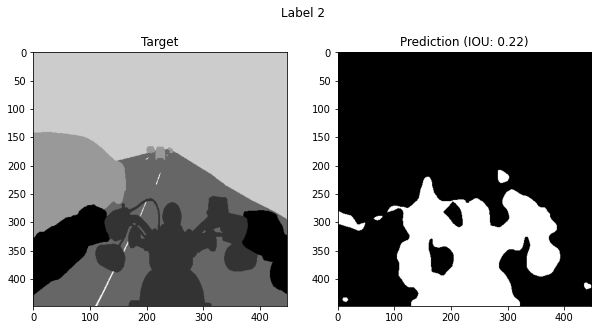

3번째 라벨 IOU: 0.14552328767123288


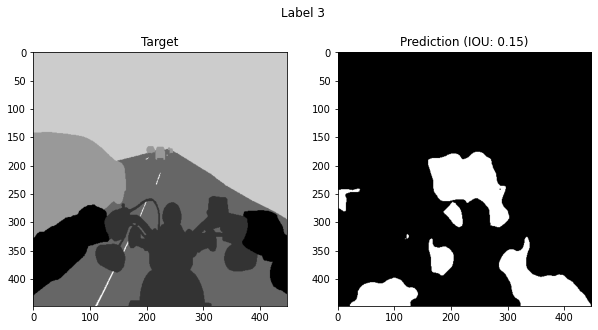

4번째 라벨 IOU: 0.06434466205626733


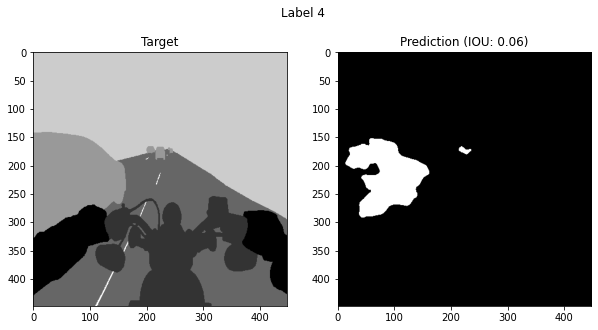

5번째 라벨 IOU: 0.4941717404766733


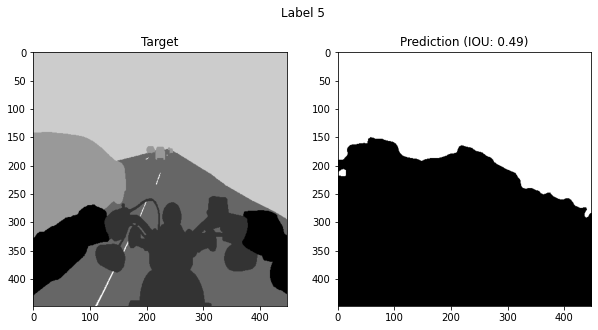

6번째 라벨 IOU: 0.0


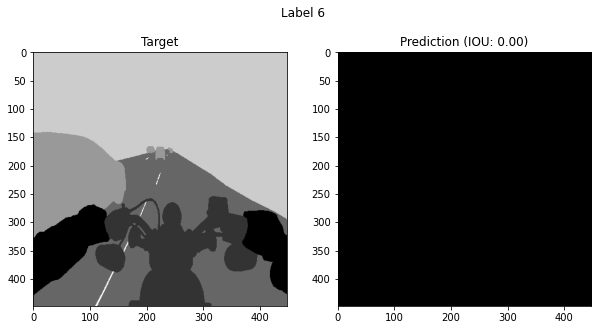

총합 가중치 IOU: 9.533280342274733
==========29번째 라벨별 점수==========
1번째 라벨 IOU: 0.005791819372392158


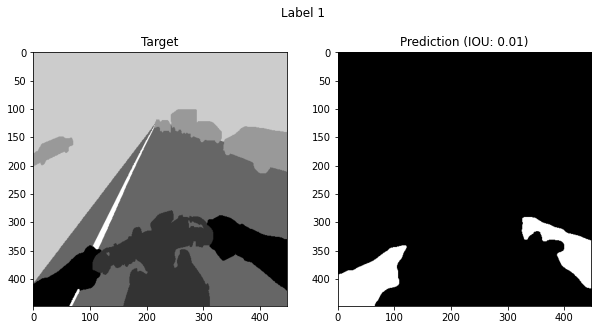

2번째 라벨 IOU: 0.12737738669674256


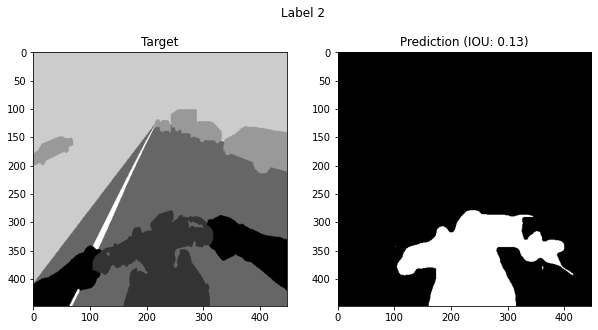

3번째 라벨 IOU: 0.43612854999377076


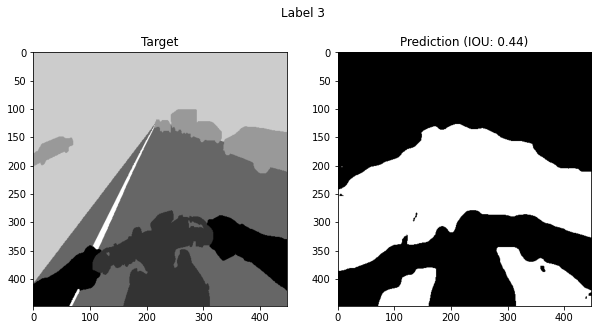

4번째 라벨 IOU: 0.035347844458649795


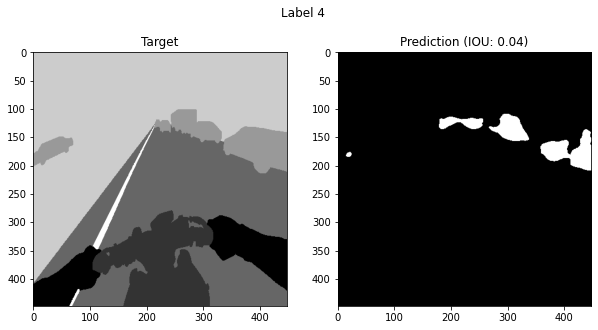

5번째 라벨 IOU: 0.36552650682037335


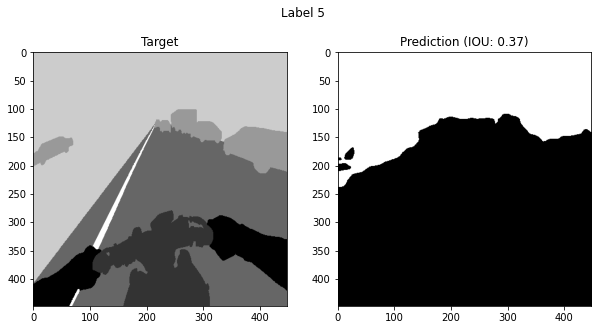

6번째 라벨 IOU: 0.0005092256519713534


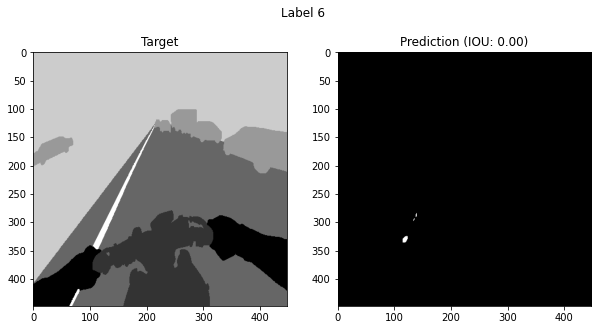

총합 가중치 IOU: 9.850043204644981
==========30번째 라벨별 점수==========
1번째 라벨 IOU: 0.03284232789452944


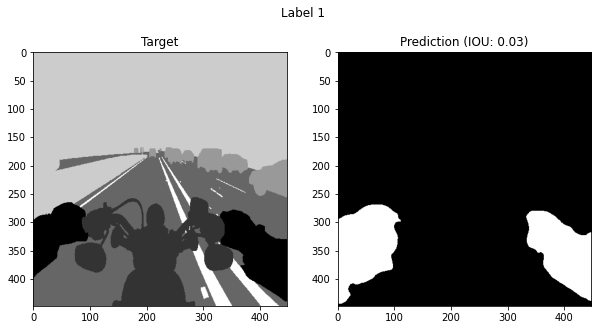

2번째 라벨 IOU: 0.15337544089902386


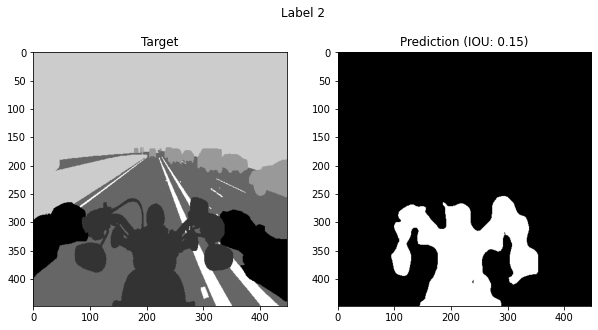

3번째 라벨 IOU: 0.27885766776569393


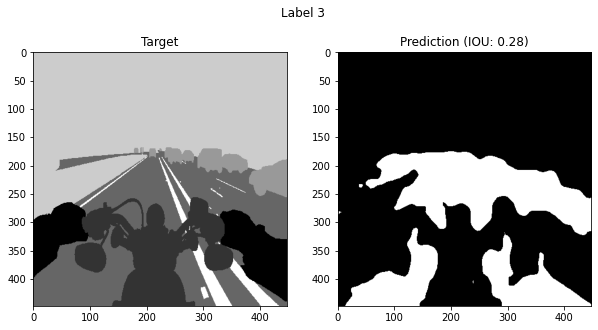

4번째 라벨 IOU: 0.023173139503721813


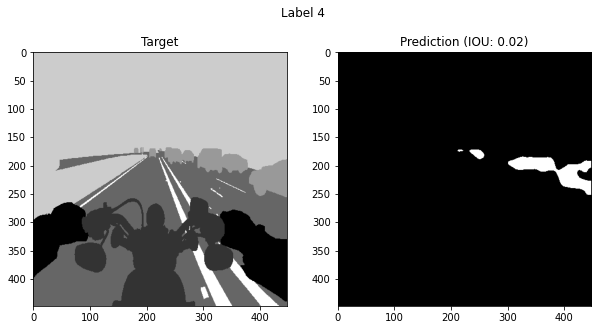

5번째 라벨 IOU: 0.4906492995177007


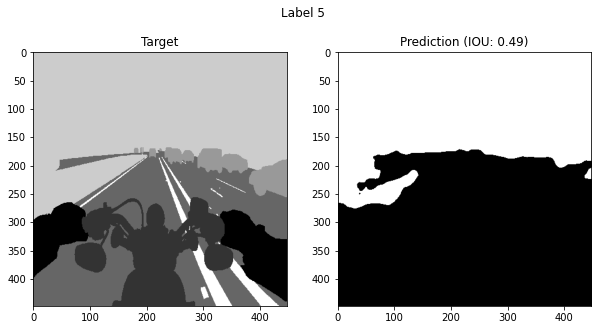

6번째 라벨 IOU: 0.0


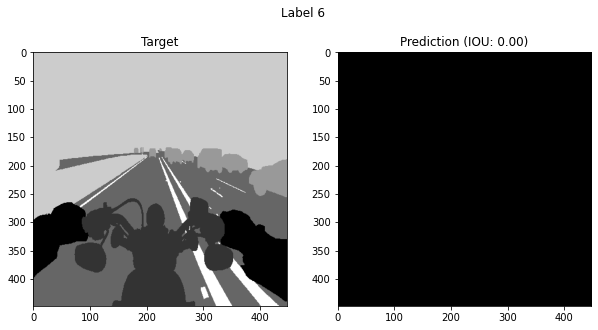

총합 가중치 IOU: 10.166303487223601


In [545]:
total_weighted_iou = 0

for i in range(30):
    area_per_label = []
    print(f"=========={i+1}번째 라벨별 점수==========")
    
    for index in range(6):
        target = targets[i][:,:,0]
        prediction = predictions[i][index]
        IoU, weight = calculate_iou_and_weight(target, prediction)
        print(f"{index+1}번째 라벨 IOU: {IoU}")
        
        total_weighted_iou += IoU * weight
        plot_target_and_prediction(target, prediction, IoU, f"Label {index+1}")

    print(f"총합 가중치 IOU: {total_weighted_iou}")

In [516]:
total_weighted_iou = 0
IoUs = []
WIoUs = []

for i in range(30):
    area_per_label = []
    #print(f"=========={i+1}번째 라벨별 점수==========")
    total_weighted_iou = 0
    iou = []
    for index in range(6):
        target = targets[i][:,:,0]
        prediction = predictions[i][index]
        IoU, weight = calculate_iou_and_weight(target, prediction)
        #print(f"{index+1}번째 라벨 IOU: {IoU}")
        iou.append(IoU)
        
        total_weighted_iou += IoU * weight
        #plot_target_and_prediction(target, prediction, IoU, f"Label {index+1}")

    IoUs.append(iou)
    WIoUs.append(total_weighted_iou)
    #print(f"총합 가중치 IOU: {total_weighted_iou}")

## 라벨별 IoU평균값

In [511]:
IoUs = np.array(IoUs)
sum_iou_per_label = np.sum(IoUs, axis=0) / 30

# Set print options to suppress the use of scientific notation
np.set_printoptions(suppress=True)

rounded_sum_iou_per_label = np.round(sum_iou_per_label, decimals=4)

print(f"UNet++ IoU per label: {rounded_sum_iou_per_label}")

UNet++ IoU per label: [0.0134 0.1689 0.2083 0.0344 0.519  0.0001]


## 모든 IoU값의 합 / 180

In [518]:
IoUs = np.array(IoUs)
total_sum = np.sum(IoUs)
print(f"UNet++ Average IoU: {total_sum/180}")

UNet++ Average IoU: 0.15734288085924433


## 30개 이미지 별 가중 평균들의 평균

In [517]:
WIoUs = np.array(WIoUs)
average_WIoUs = np.mean(WIoUs)
print(f"UNet++ Average WIoUs: {average_WIoUs}")

Average WIoUs: 0.33887678290745354


# 3. GCAM

In [62]:
def normalize_and_resize_img(input_path, image_path):
    input_image = img_to_array(load_img(input_path, target_size = (448,448)))
    input_image = input_image[:,:,:3]
    #print(input_image.shape)
    input_image = tf.cast(input_image, tf.float32)/255.
    
    color_to_label = {89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}
    ground_truth = img_to_array(load_img(label_path, target_size = (448,448), color_mode = 'grayscale'))
    ground_truth = ground_truth[:,:,0]
    for unique_value in color_to_label:
        ground_truth[ground_truth == unique_value] = color_to_label[unique_value]
    #print(ground_truth.shape)
    ground_truth = tf.cast(ground_truth, tf.float32)/255.

    return input_image, ground_truth

In [90]:
import cv2

def generate_grad_cam(model, activation_layer, input_path, image_path):
    list_name = ["Rider", "My bike", "Road", "Movable", "Undirvable", "Lanemark"]
    width = 448
    height = 448
    
    img_tensor, class_idx = normalize_and_resize_img(input_path, image_path)
    
    grad_model = tf.keras.models.Model([model.inputs], 
                                       [model.get_layer(activation_layer).output, model.output])
    
    for i in range(6):
        with tf.GradientTape() as tape:
            conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))
            loss = pred[0, :, :, i]
            output = conv_output[0]
        
            grad_val = tape.gradient(loss, conv_output)[0]
    
        weights = np.mean(grad_val, axis=(0, 1))
        grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    
        for k, w in enumerate(weights):
            grad_cam_image += w * output[:, :, k]
        
        grad_cam_image = tf.math.maximum(0, grad_cam_image)
        grad_cam_image /= np.max(grad_cam_image)
        grad_cam_image = grad_cam_image.numpy()
        grad_cam_image = cv2.resize(grad_cam_image, (width, height))
        
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 6, i+1)
        plt.imshow(grad_cam_image)
        plt.title(f"{i}:{[list_name[i]]}")
        plt.axis('off')
        plt.show()
    

=========================0번째 그림===========================


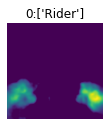

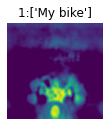

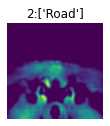

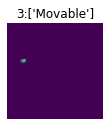

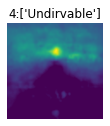

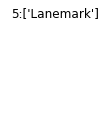

=========================1번째 그림===========================


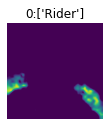

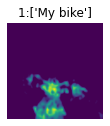

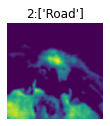

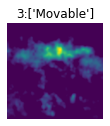

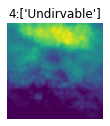

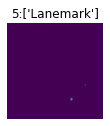

=========================2번째 그림===========================


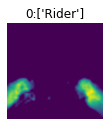

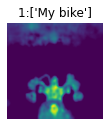

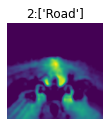

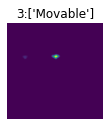

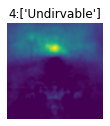

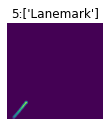

=========================3번째 그림===========================


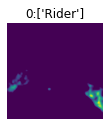

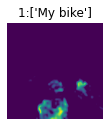

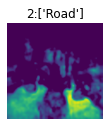

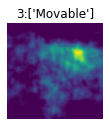

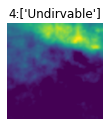

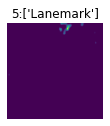

=========================4번째 그림===========================


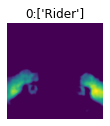

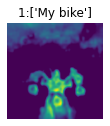

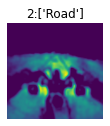

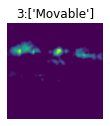

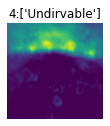

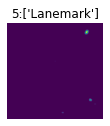

=========================5번째 그림===========================


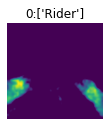

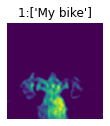

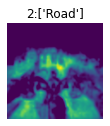

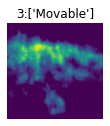

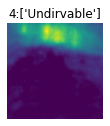

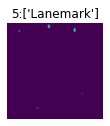

=========================6번째 그림===========================


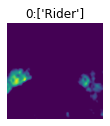

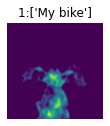

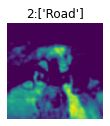

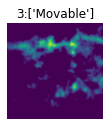

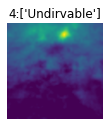

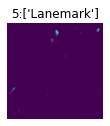

=========================7번째 그림===========================


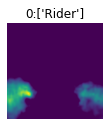

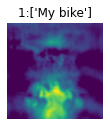

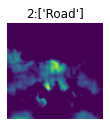

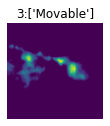

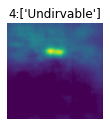

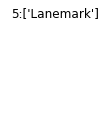

=========================8번째 그림===========================


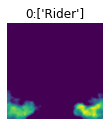

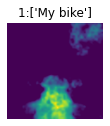

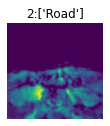

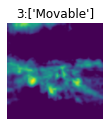

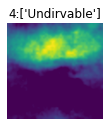

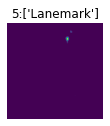

=========================9번째 그림===========================


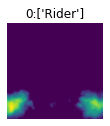

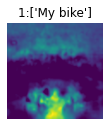

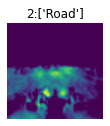

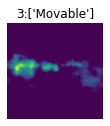

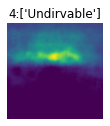

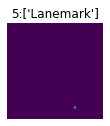

=========================10번째 그림===========================


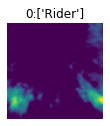

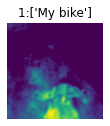

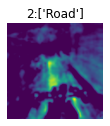

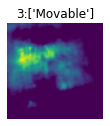

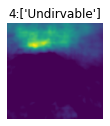

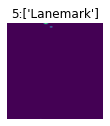

=========================11번째 그림===========================


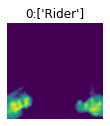

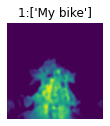

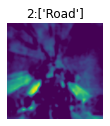

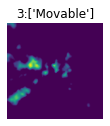

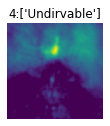

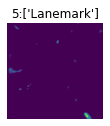

=========================12번째 그림===========================


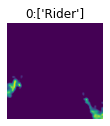

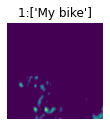

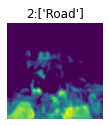

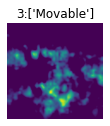

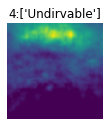

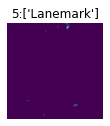

=========================13번째 그림===========================


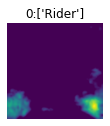

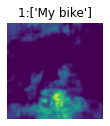

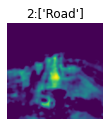

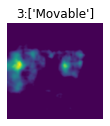

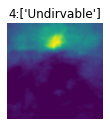

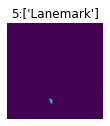

=========================14번째 그림===========================


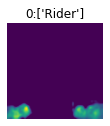

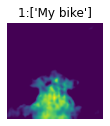

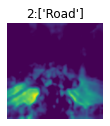

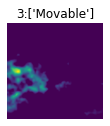

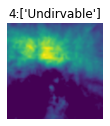

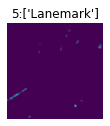

=========================15번째 그림===========================


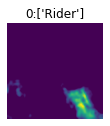

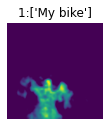

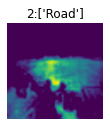

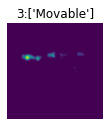

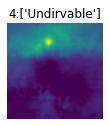

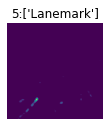

=========================16번째 그림===========================


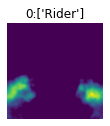

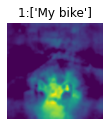

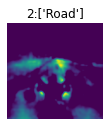

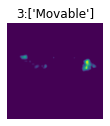

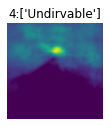

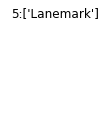

=========================17번째 그림===========================


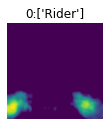

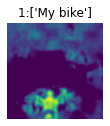

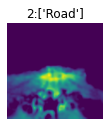

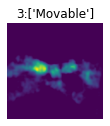

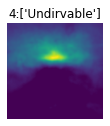

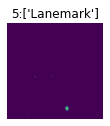

=========================18번째 그림===========================


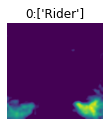

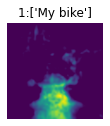

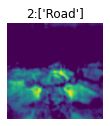

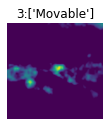

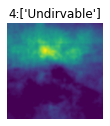

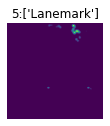

=========================19번째 그림===========================


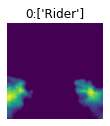

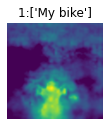

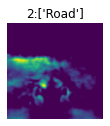

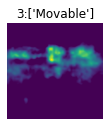

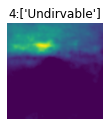

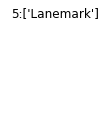

=========================20번째 그림===========================


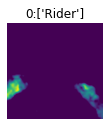

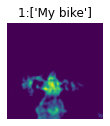

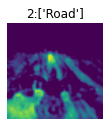

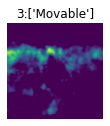

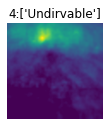

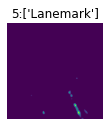

=========================21번째 그림===========================


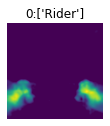

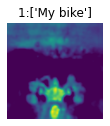

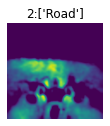

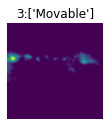

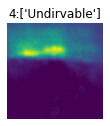

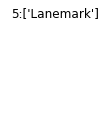

=========================22번째 그림===========================


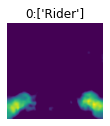

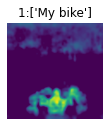

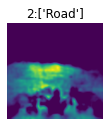

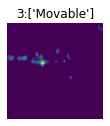

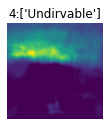

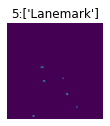

=========================23번째 그림===========================


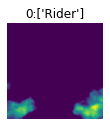

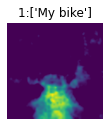

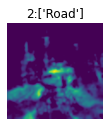

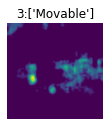

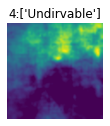

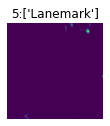

=========================24번째 그림===========================


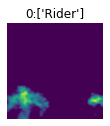

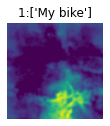

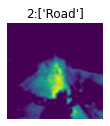

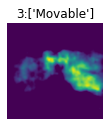

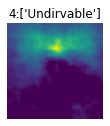

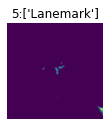

=========================25번째 그림===========================


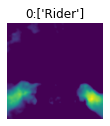

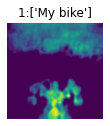

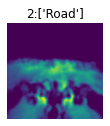

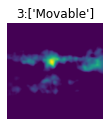

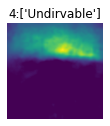

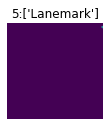

=========================26번째 그림===========================


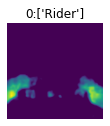

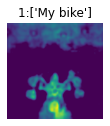

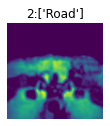

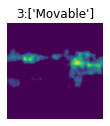

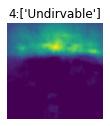

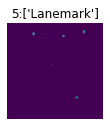

=========================27번째 그림===========================


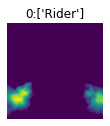

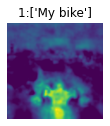

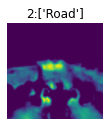

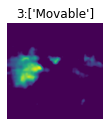

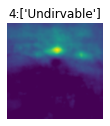

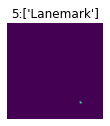

=========================28번째 그림===========================


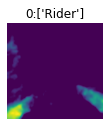

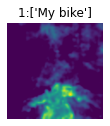

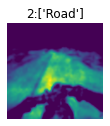

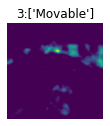

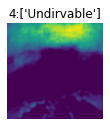

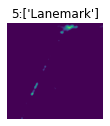

=========================29번째 그림===========================


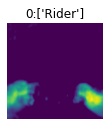

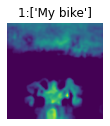

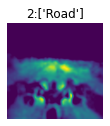

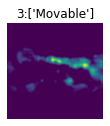

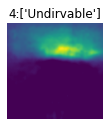

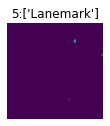

In [91]:
for i in range(30):
    print(f"========================={i}번째 그림===========================")
    grad_cam_image = generate_grad_cam(DLV3Plus, 'up_sampling2d_2', test_input_images_path[i], test_label_images_path[i])

In [82]:
import cv2

def generate_grad_cam(model, activation_layer, input_path, image_path):
    list_name = ["Rider", "My bike", "Road", "Movable", "Undirvable", "Lanemark"]
    width = 448
    height = 448
    
    img_tensor, class_idx = normalize_and_resize_img(input_path, image_path)
    
    grad_model = tf.keras.models.Model([model.inputs], 
                                       [model.get_layer(activation_layer).output, model.output])
    
    i = 1
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))
        loss = pred[0, :, :, i]
        output = conv_output[0]
        
        grad_val = tape.gradient(loss, conv_output)[0]
    
    weights = np.mean(grad_val, axis=(0, 1))
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    
    for k, w in enumerate(weights):
        grad_cam_image += w * output[:, :, k]
        
    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
        
    plt.figure(figsize=(6, 6))
    plt.subplot(1, 1, 1)
    plt.imshow(grad_cam_image)
    plt.title(f"{i}:{[list_name[i]]}")
    plt.axis('off')
    plt.show()
    

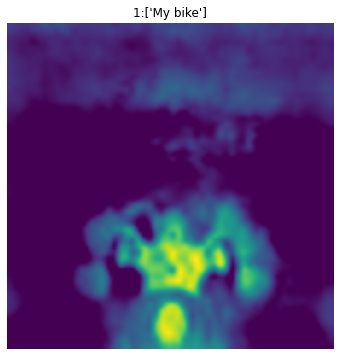

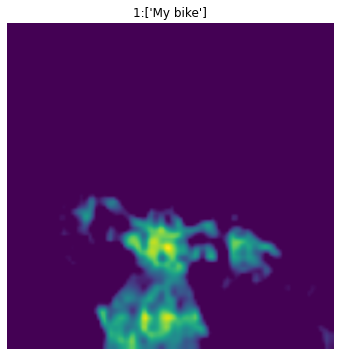

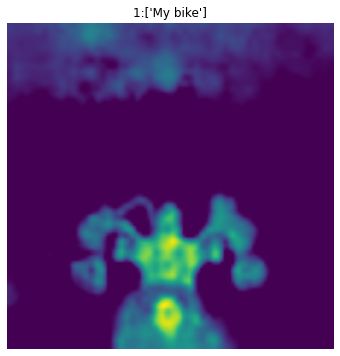

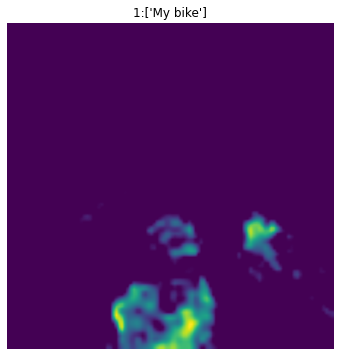

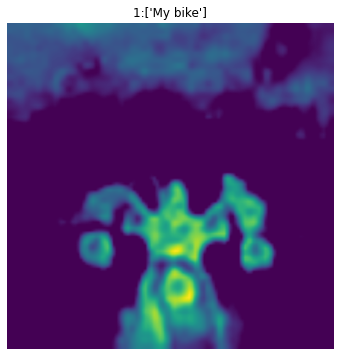

...

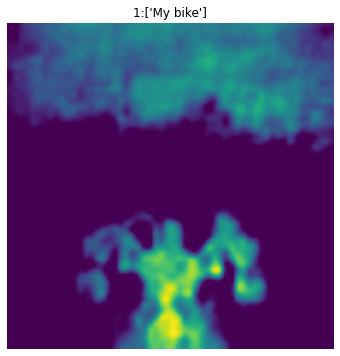

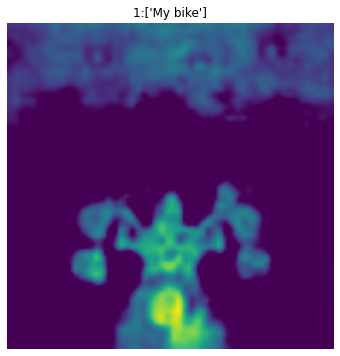

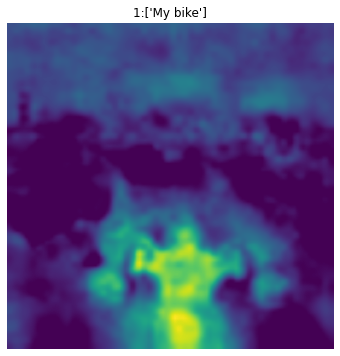

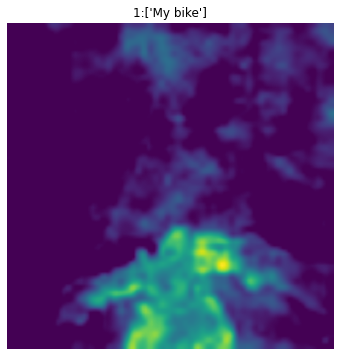

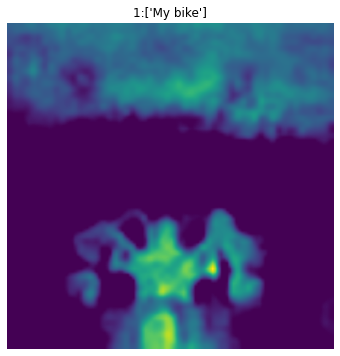

In [83]:
for i in range(30):
    grad_cam_image = generate_grad_cam(DLV3Plus, 'up_sampling2d_2', test_input_images_path[i], test_label_images_path[i])